# Лавренов Виталий М221БД

In [2]:
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import cross_validate
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
import matplotlib.pyplot as plt
import sys
import os
import pydicom

from torch import optim
import torch
from torch import nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from PIL import Image
%matplotlib inline

более менее интересные аттрибуты файлов со снимками

In [6]:
attrs = [(0x8, 0x103e),
(0x8, 0x1140),
(0x18, 0x20),
(0x18, 0x21),
(0x18, 0x22),
(0x18, 0x23),
(0x18, 0x1030),
(0x18, 0x1312),
(0x28, 0x106),
(0x28, 0x107),
(0x43, 0x102f),
(0x8, 0x1030),
(0x8, 0x103e),
(0x10, 0x10)#patirnt name
        ]
len(attrs)

14

In [3]:
def take_need_files():
    datafiles = []
    count = 0
    imtypes = set()
    patients = set()
    PathDicom = "./mrt/"
    lstFilesDCM = []  # create an empty list
    for dirName, subdirList, fileList in os.walk(PathDicom):
        for filename in fileList:
            if ".dcm" in filename.lower():  # check whether the file's DICOM
                lstFilesDCM.append(os.path.join(dirName, filename))
                
    print('all files count', len(lstFilesDCM))
    
    for fileDCM in lstFilesDCM:
        ds = pydicom.read_file(fileDCM)
        try:
            t = ds[attrs[12]].value
            patient = ds[attrs[13]].value
            imtypes.add(t)
            patients.add(str(patient))
        except:
            count += 1
            continue
        
        if ('T1' in t or 'T2' in t or 't1' in t or 't2' in t) and 'после' not in fileDCM:#change to get other data
            datafiles.append(fileDCM)
            
    print ('no need attr count', count)
    print('need files count', len(datafiles))
    f = open('file_list.txt', 'w')
    for i in datafiles:
        f.write(i + '\n')
    f.close()
    
    return datafiles, imtypes, patients
    #(0010, 0010)

In [8]:
datafiles, imtypes, patients = take_need_files()

all files count 81426
no need attr count 0
need files count 9058


In [4]:
imtypes

NameError: name 'imtypes' is not defined

In [3]:

def extract_data(datafiles, sh=128, d3=True):
    sizes = set()
    data = []
    other = []
    y = []
    flourescented = ['DEMKIN A.P.', 'ZHURAVLEVA E.V.', 'MOVLATOVA L.B.', 'PETROV S.V.', 'POPOVA I.I.', 'SAFRONOVA T.A.', 'ANTROPOVA E.P.', 
 'BRITIKOVA E.V.', 'GACHKAEVA S.V.', 'SHURUPOV V.YA.', 'KHAKIMOVA M.M.', 'DASHKINA R.F.']
    count = 0
    for fileDCM in datafiles:
        ds = pydicom.read_file(fileDCM)
        
        sex = ds[(0x10, 0x40)].value
        sex = 1 if sex == 'M' else 0
        age = ds[(0x10, 0x1010)].value
        age = int(age[:-1])
        weight = ds[(0x10, 0x1030)].value
        weight = float(weight)
        
        patient = ds[attrs[13]].value
        ds = ds.pixel_array
        if len(ds.shape) > 2:
            count += 1
            continue
        
        other.append([sex, age, weight])
        sizes.add(ds.shape)
        if ds.shape[0] != sh:
                
            gg = Image.fromarray(ds)
            gg = gg.resize((sh, sh))
            curr = np.asarray(gg)
            if not d3:
                curr = curr.reshape(sh**2)
        else:
            curr = ds
            if not d3:
                curr = curr.reshape(sh**2)
        mmax = float(np.max(curr))
        if mmax != 0:
            curr = curr / mmax 
        if d3:
            data.append([curr])
        else:
            data.append(curr)
        if patient in flourescented:
            y.append(0)
        else:
            y.append(1)
    print('3d im count', count)
    data = np.array(data, dtype=float)
    other = np.array(other)
    print('sizes', sizes)
    return data, y, other

In [4]:
datafiles = []
f = open('file_list.txt', 'r', encoding='UTF-8')
for i in f:
    datafiles.append(i[:-1])
f.close()


In [7]:
attrs_user = [(0x10, 0x40),#sex
              (0x10, 0x1010),#age
              (0x10, 0x1030)]#weight
              #(0x18, 0x25),#angio flag NO
              #(0x18, 0x85),]# Imaged Nucleus NO
attrs_dict = {}
attrs_vals = {}
attr = 0
attrs_data = []
for a in attrs_user:
    attrs_dict[a] = 0
    attrs_vals[a] = set()
for f in datafiles:
    ds = pydicom.read_file(f)
    row = []
    for a in attrs_user:
        try:
            attr = ds[a]
            row.append(attr)
            attrs_vals[a].add(attr.value)
        except:
            attrs_dict[a] += 1
    attrs_data.append(row)    

print (attrs_dict)
print (attrs_vals)

{(16, 64): 0, (16, 4112): 0, (16, 4144): 0}
{(16, 64): {'M', 'F'}, (16, 4112): {'053Y', '038Y', '045Y', '028Y', '040Y', '052Y', '063Y', '061Y', '041Y', '066Y', '039Y', '043Y', '023Y', '068Y', '056Y', '037Y', '035Y', '057Y', '058Y', '062Y', '059Y', '067Y', '048Y', '054Y', '049Y', '071Y', '026Y', '051Y', '030Y', '050Y', '032Y', '060Y', '042Y', '036Y', '034Y', '064Y', '017Y', '046Y'}, (16, 4144): {"96", "65.0", "100", "68", "70", "75", "76", "107", "110", "80", "50", "85", "87", "88", "90", "91", "60"}}


In [28]:
int('017Y'[:-1])

17

In [11]:
datafiles

['./mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.605.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.606.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.607.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.608.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.609.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.610.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.611.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.612.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.613.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.614.dcm',
 './mrt/new\\аболмазов р в\\1.2.840.113619.2.312.6945.1127356.11178.1471437144.615.dcm',
 './mrt/new\\аболмазо

In [7]:
d2data, y, other = extract_data(datafiles, sh=64, d3=False)
other

3d im count 20
sizes {(320, 320), (512, 512), (256, 256), (768, 768), (576, 576), (80, 80), (320, 280), (448, 364), (256, 200)}


array([[  1.,  56., 100.],
       [  1.,  56., 100.],
       [  1.,  56., 100.],
       ...,
       [  1.,  63.,  90.],
       [  1.,  63.,  90.],
       [  1.,  63.,  90.]])

In [38]:
(pd.DataFrame(other)[0] == 0).any()

True

парсим файлы

In [88]:
imgs

{'./mrt/Аддинисков\\до': {'3D ASL',
  'AX T2 FSE ASSET',
  'Ax  T2 FLAIR',
  'Ax T1 MEMP +C',
  'Ax T1 SE',
  'Cerebral Blood Flow',
  'DWI ASSET',
  'FSPGR BRAVO 1.0mm AX+C',
  'Processed Images',
  'SCREENSAVE',
  'Sag FLAIR CUBE'},
 './mrt/Багрова\\до': {'Cal Head 24',
  'FILT_PHA: SWAN',
  'Localizer',
  'MAGiC',
  'MAGiC PD',
  'MAGiC PSIR',
  'MAGiC STIR',
  'MAGiC T1',
  'MAGiC T2',
  'MultiPlanar Reconstruction (MPR) Ob_Ax_I -> S_Min IP_sp:10.0_th:',
  'QMaps (T1T2PD)',
  'SWAN'},
 './mrt/Багрова\\после': {'3D ASL',
  'AX T2 FSE ASSET',
  'Ax  T2 FLAIR',
  'Ax T1 MEMP +C',
  'DWI ASSET',
  'FSPGR BRAVO 1.0mm AX',
  'FSPGR BRAVO 1.0mm AX+C'},
 './mrt/Баженов\\до': {'AX T2 FSE ASSET',
  'Ax  T2 FLAIR',
  'Ax T1 MEMP +C',
  'DWI ASSET',
  'FSPGR BRAVO 1.0mm AX',
  'FSPGR BRAVO 1.0mm AX+C'},
 './mrt/Бахарева\\до': {'AX T2 FSE ASSET',
  'Ax  T2 FLAIR',
  'Ax T1 SE',
  'DWI ASSET',
  'FSPGR BRAVO 1.2mm AX',
  'Processed Images'},
 './mrt/Борисов\\до': {'DTI 33Dir ASSET',
  'Processed

In [63]:
for key, value in imgs.items():
    print('*************************************')
    print(key)
    for i in value:
        print(i)
    print('*************************************')

*************************************
./mrt/Аддинисков\до
Ax T1 SE
Processed Images
DWI ASSET
FSPGR BRAVO 1.0mm AX+C
Ax T1 MEMP +C
AX T2 FSE ASSET
Sag FLAIR CUBE
SCREENSAVE
Cerebral Blood Flow
3D ASL
Ax  T2 FLAIR
*************************************
*************************************
./mrt/Багрова\до
MAGiC PD
SWAN
MAGiC T1
Localizer
FILT_PHA: SWAN
QMaps (T1T2PD)
MAGiC PSIR
MAGiC STIR
MultiPlanar Reconstruction (MPR) Ob_Ax_I -> S_Min IP_sp:10.0_th:
MAGiC
MAGiC T2
Cal Head 24
*************************************
*************************************
./mrt/Багрова\после
DWI ASSET
FSPGR BRAVO 1.0mm AX+C
Ax T1 MEMP +C
FSPGR BRAVO 1.0mm AX
AX T2 FSE ASSET
3D ASL
Ax  T2 FLAIR
*************************************
*************************************
./mrt/Баженов\до
DWI ASSET
FSPGR BRAVO 1.0mm AX+C
Ax T1 MEMP +C
FSPGR BRAVO 1.0mm AX
AX T2 FSE ASSET
Ax  T2 FLAIR
*************************************
*************************************
./mrt/Бахарева\до
Ax T1 SE
Processed Images
DWI ASS

In [39]:
def plot_pixel_array(dataset, figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.imshow(dataset, cmap=plt.cm.bone)
    plt.show()

примеры снимков каждого типа

AX T2 FSE ASSET


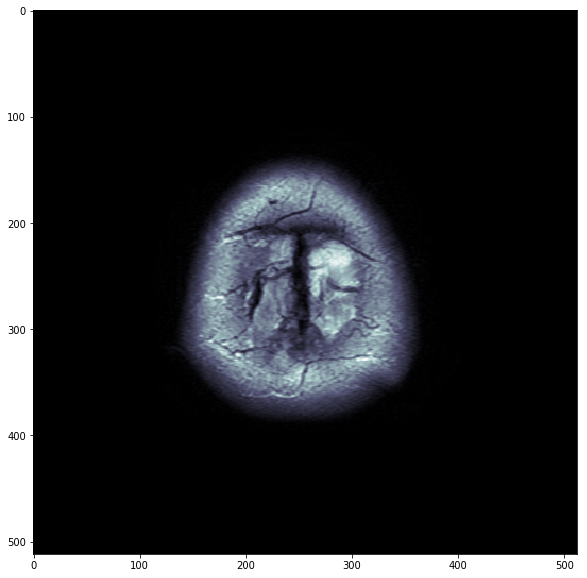

Ax  T2 FLAIR


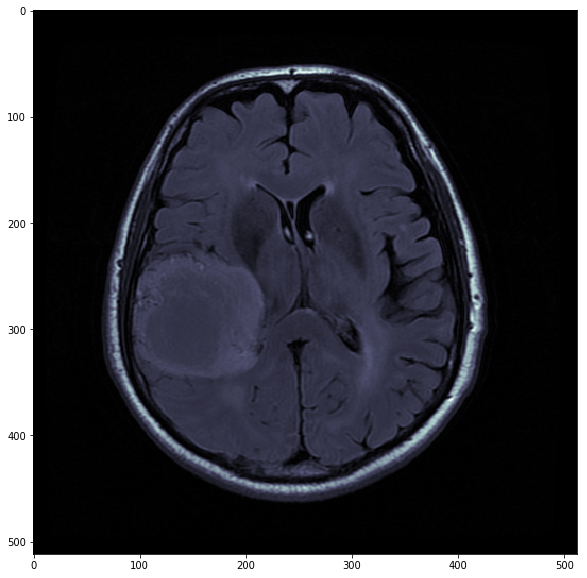

DWI ASSET


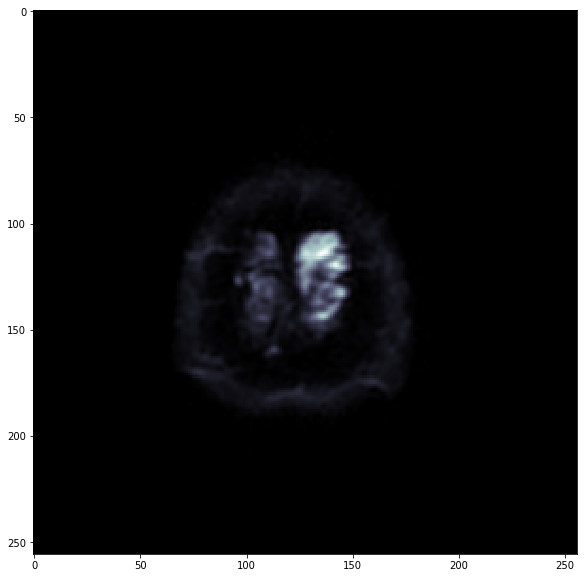

Ax T1 SE


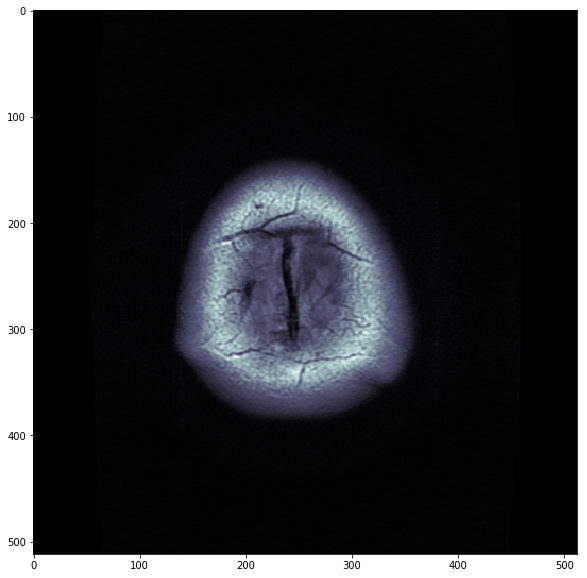

3D ASL


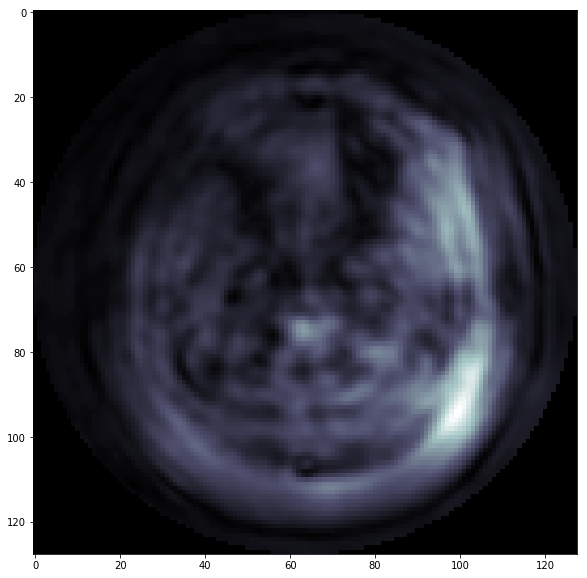

Ax T1 MEMP +C


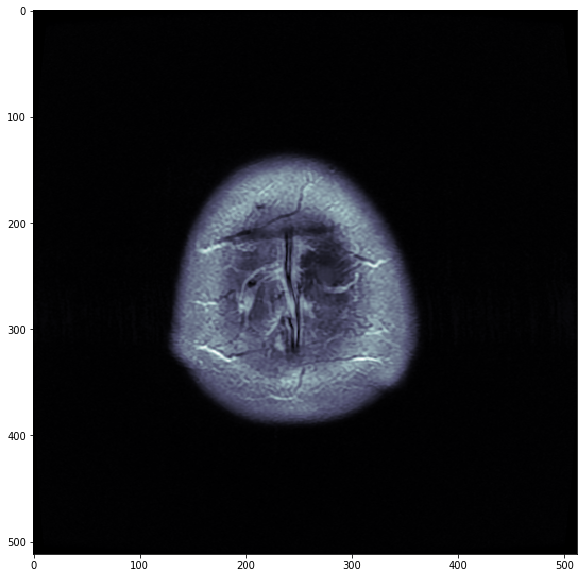

FSPGR BRAVO 1.0mm AX+C


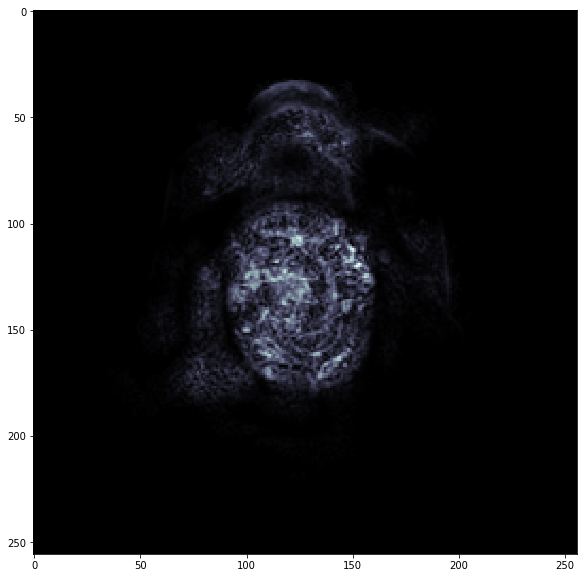

Sag FLAIR CUBE


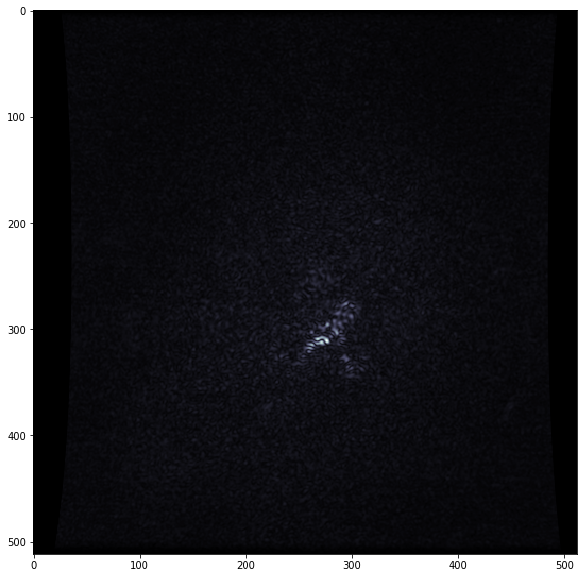

SCREENSAVE


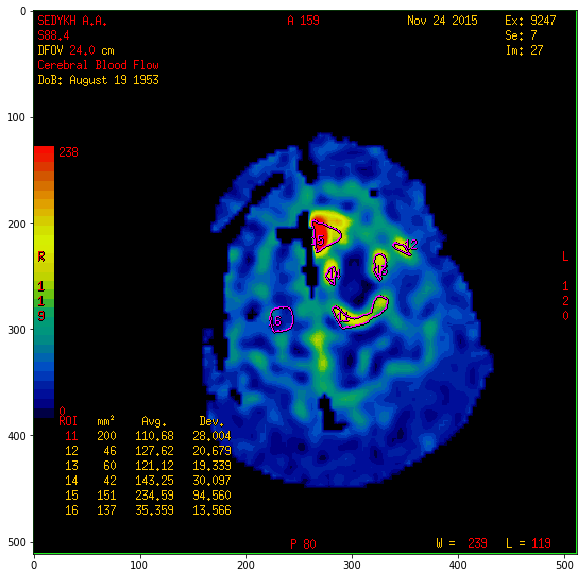

Cerebral Blood Flow


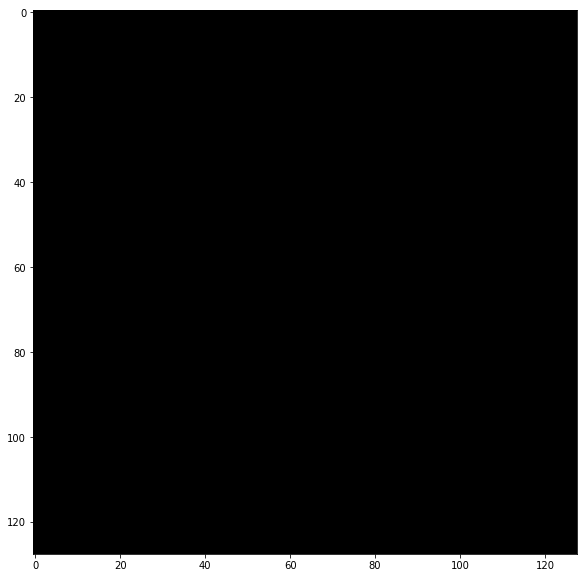

Processed Images


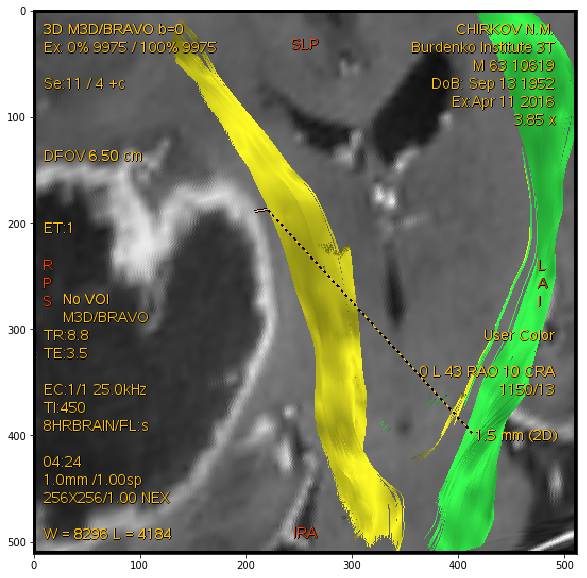

QMaps (T1T2PD)


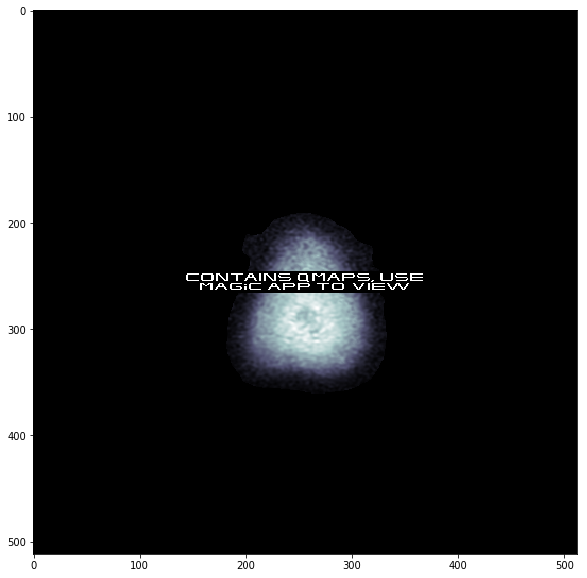

MAGiC T2


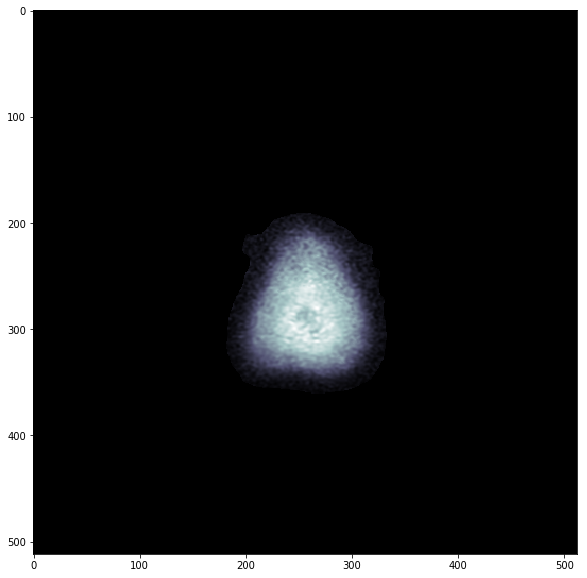

MAGiC T1


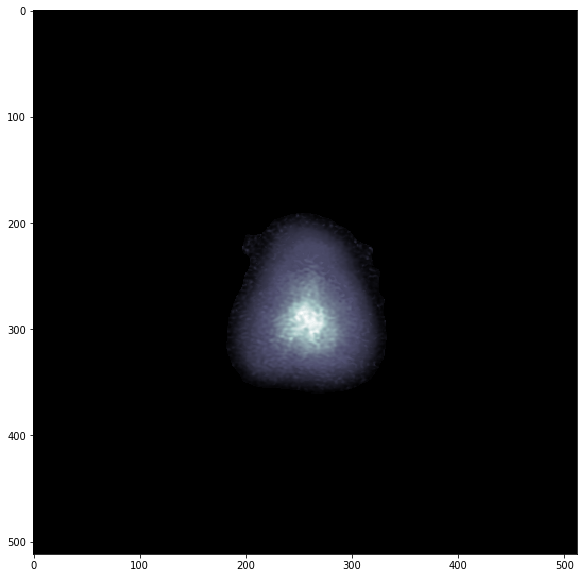

MAGiC STIR


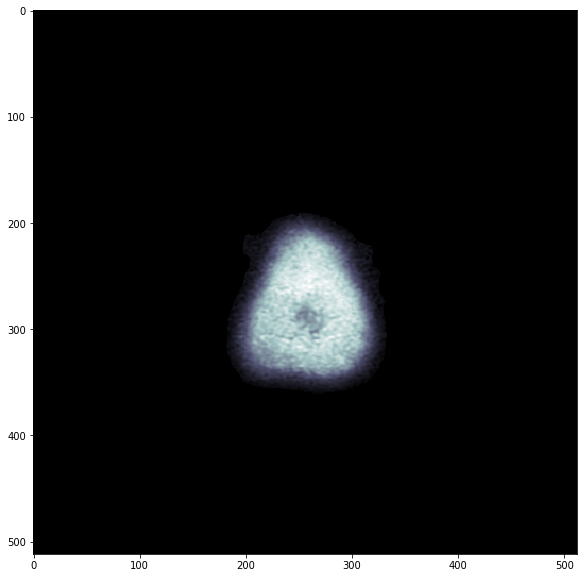

MAGiC PSIR


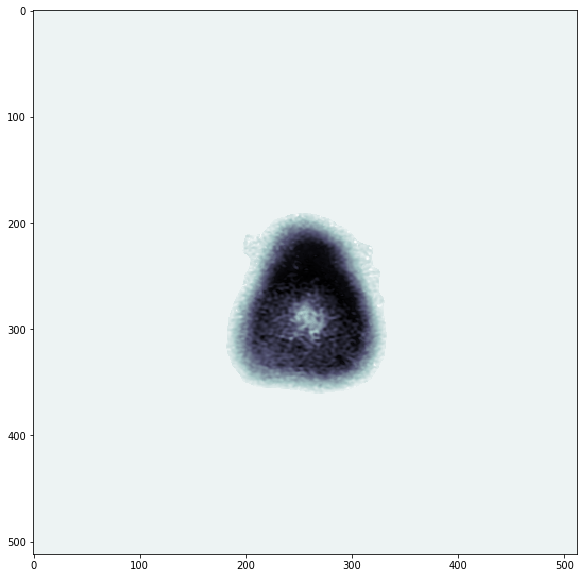

MAGiC PD


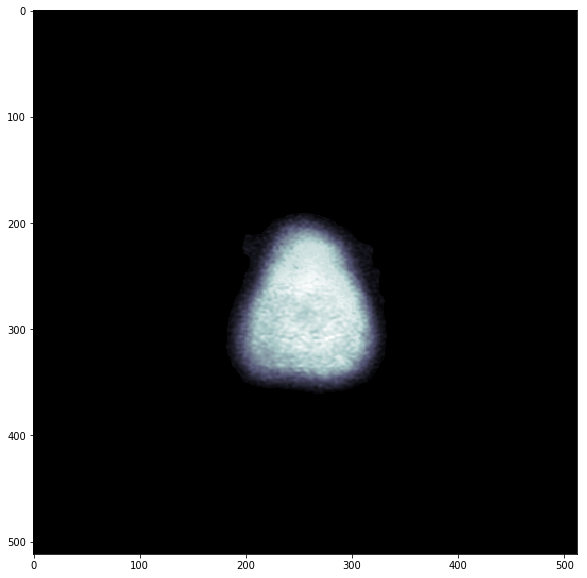

MultiPlanar Reconstruction (MPR) Ob_Ax_I -> S_Min IP_sp:10.0_th:


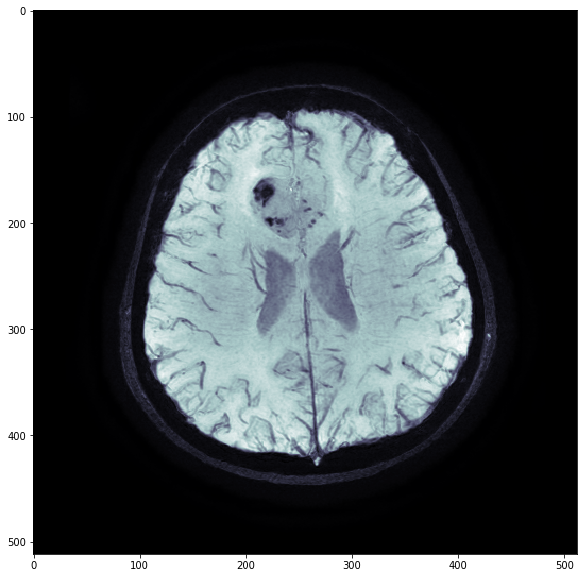

Localizer


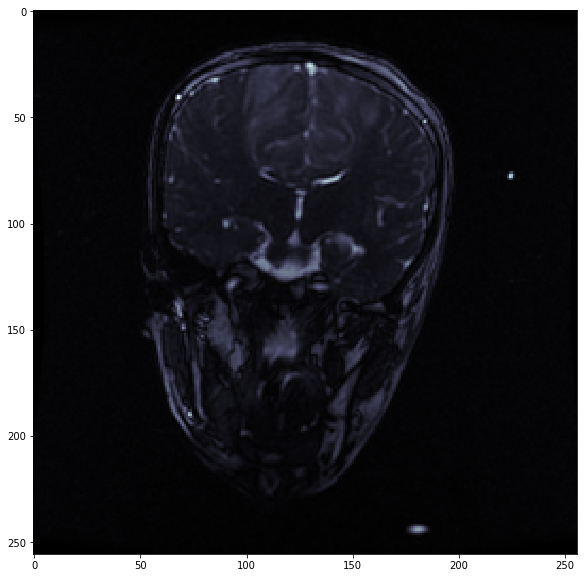

Cal Head 24


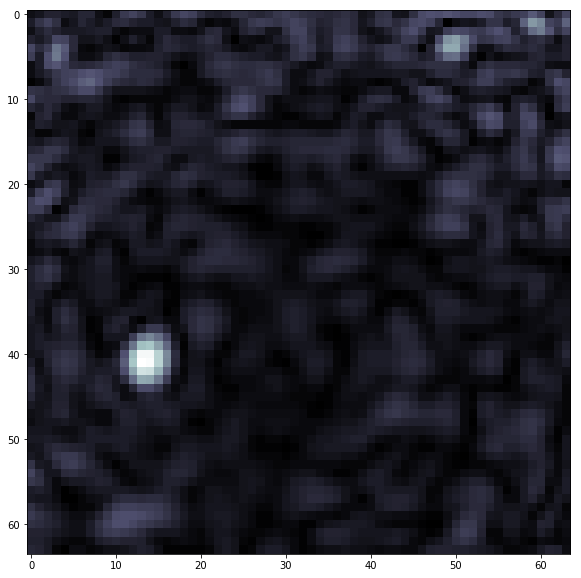

FILT_PHA: SWAN


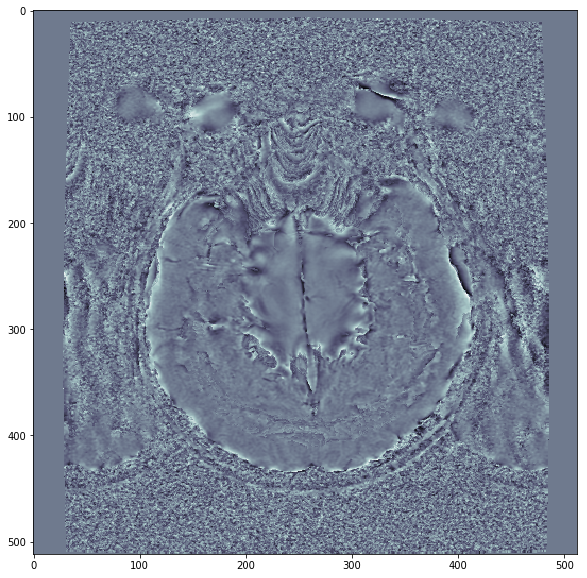

SWAN


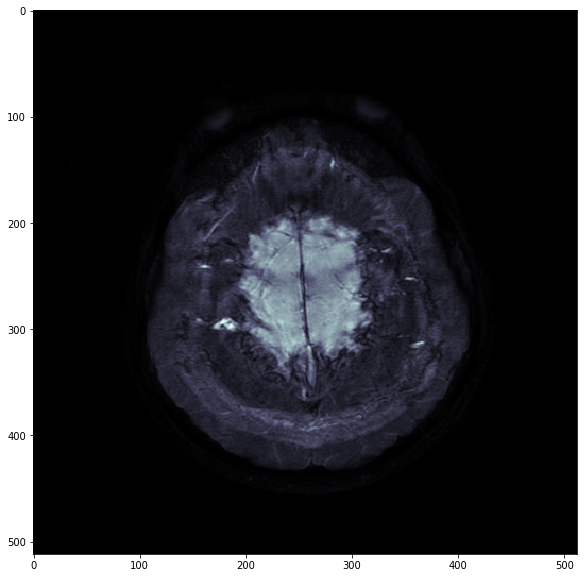

MAGiC


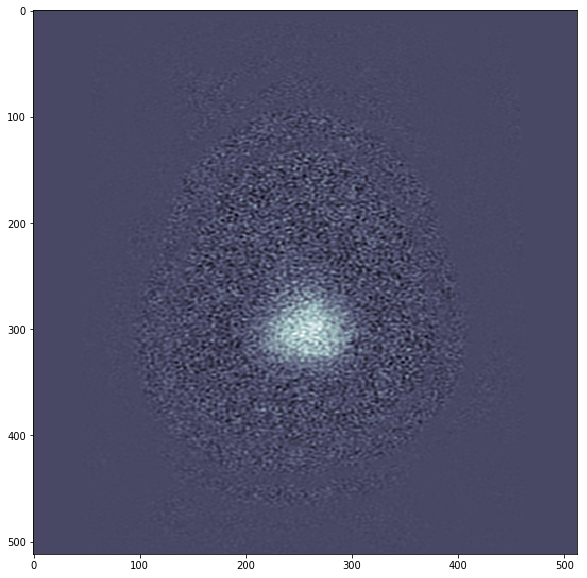

FSPGR BRAVO 1.0mm AX


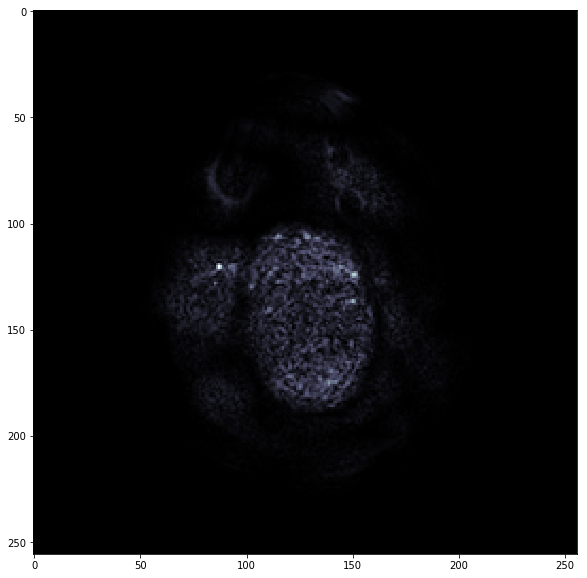

FSPGR BRAVO 1.2mm AX


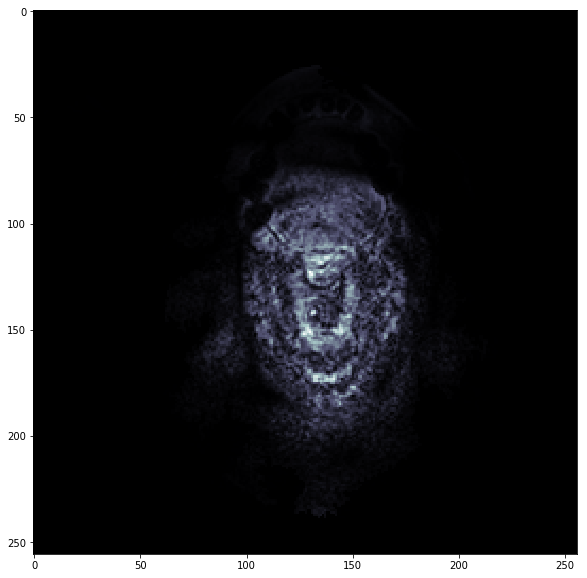

navigation trak


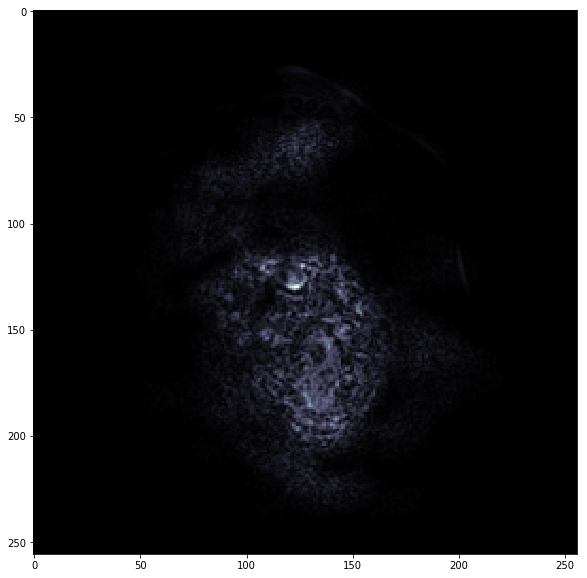

DTI 33Dir ASSET


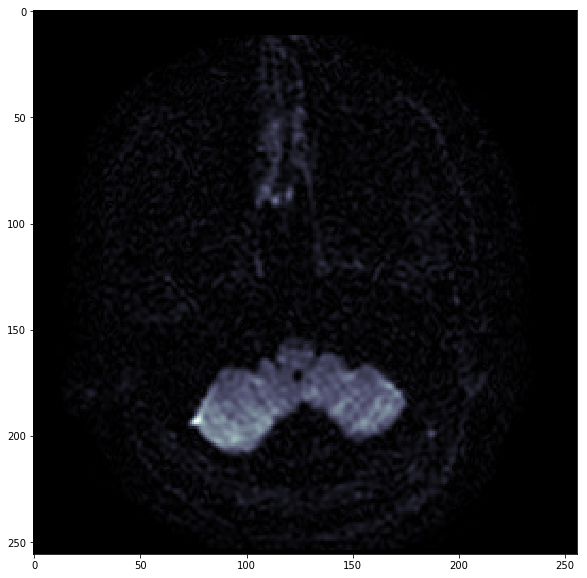

Ax T2 FRFSE


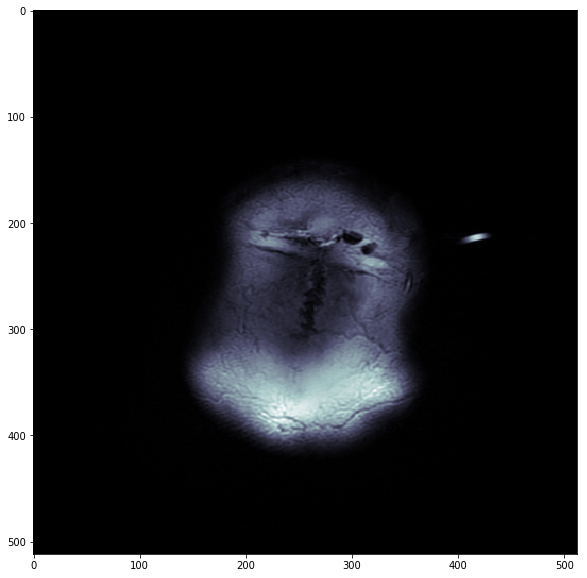

Ax T1 FSE


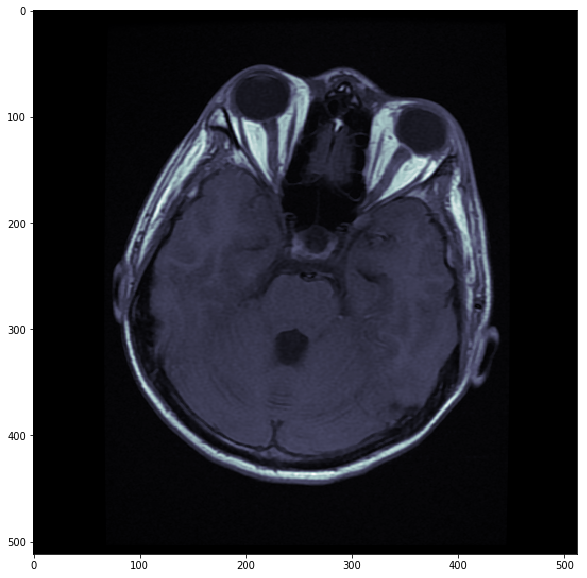

Ax T2 FLAIR


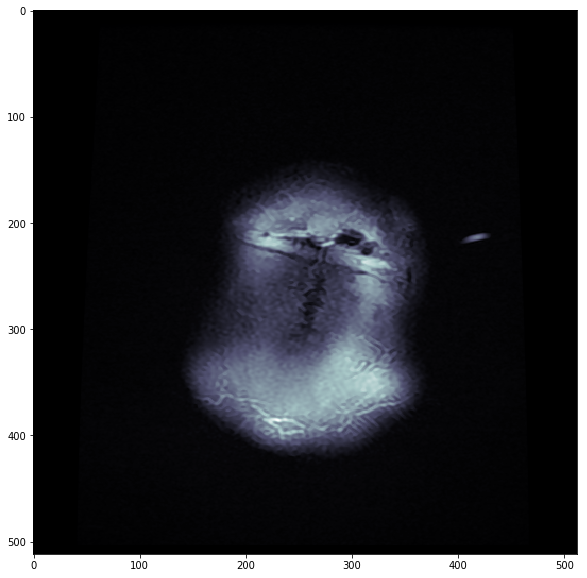

Ax T1 SE MEMP+C


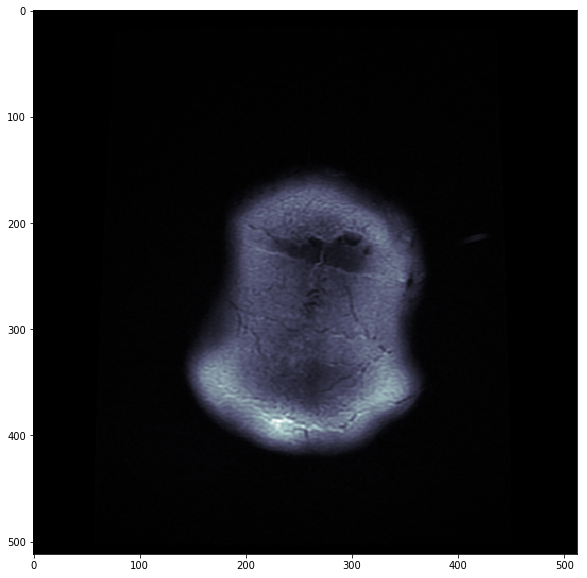

Sag T1 FSE+C


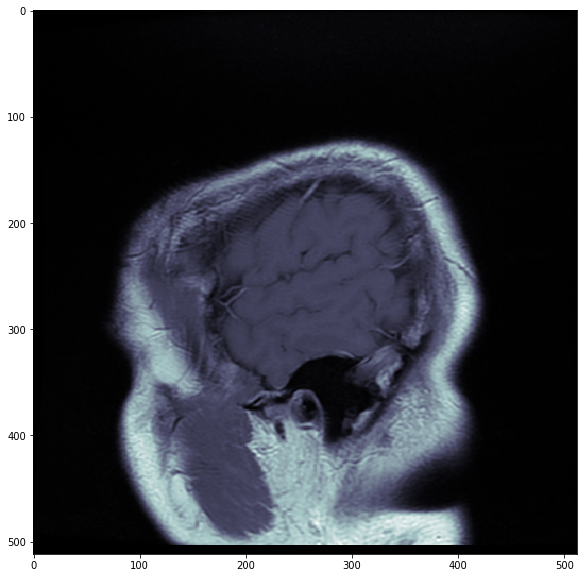

Cor T1 FSE+C


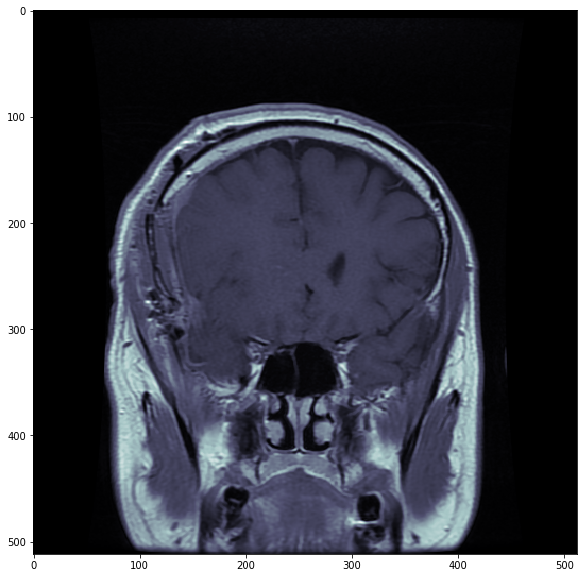

3 Plane Localizer


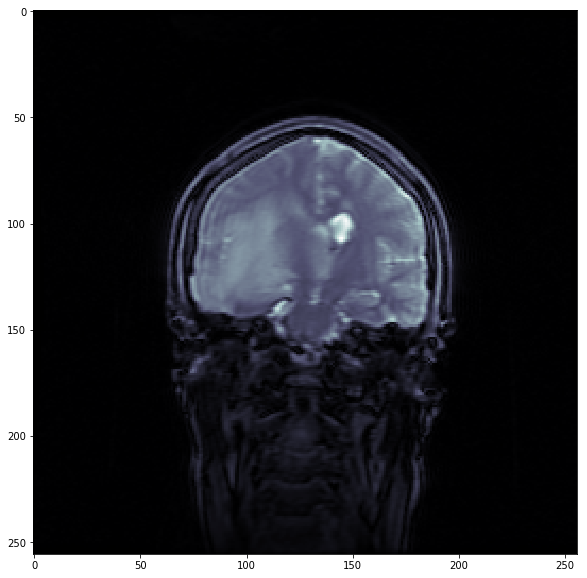

DTI 33Dir ASSET+AX


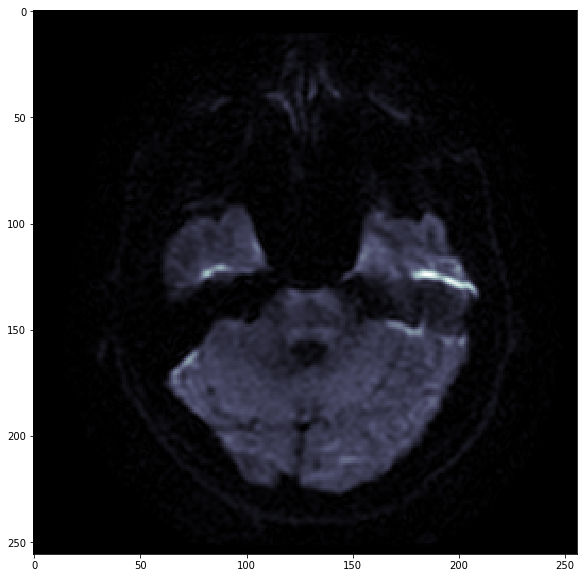

DTI 33Dir ASSET+COR


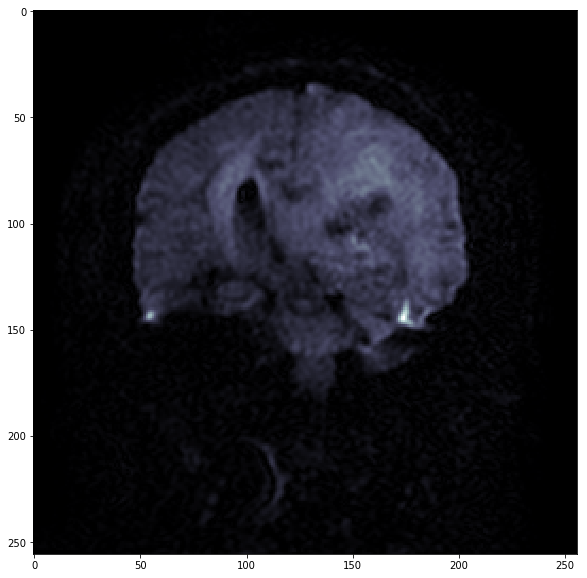

Average DCASSET+COR


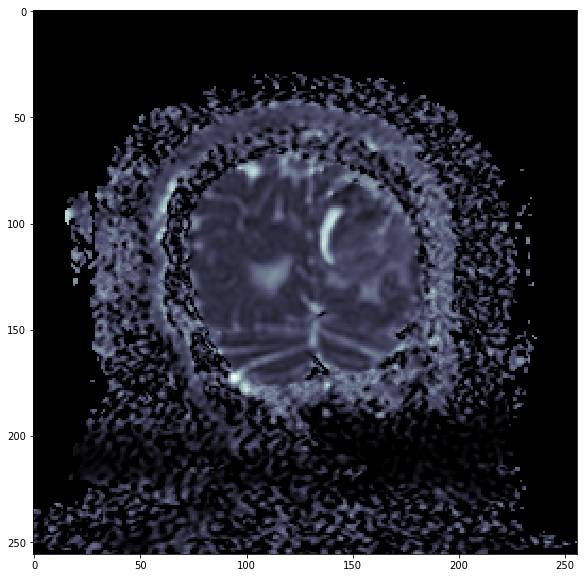

Fractional Ansio.OR


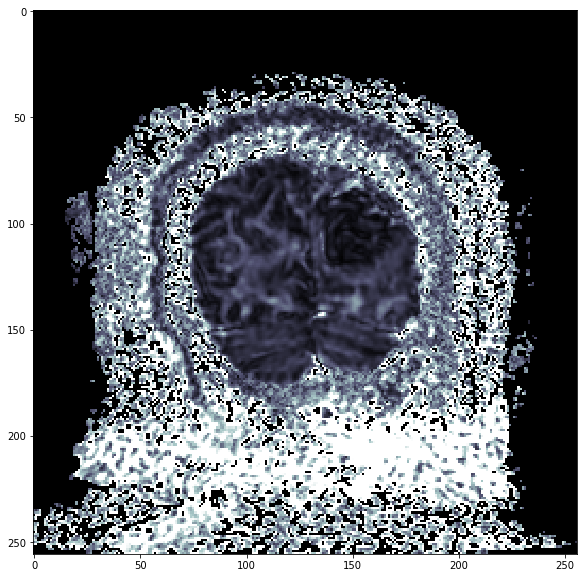

T2-weighted traceOR


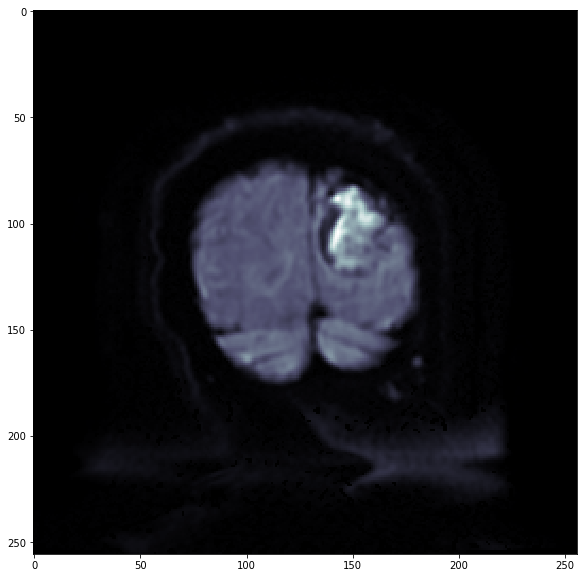

Average DC


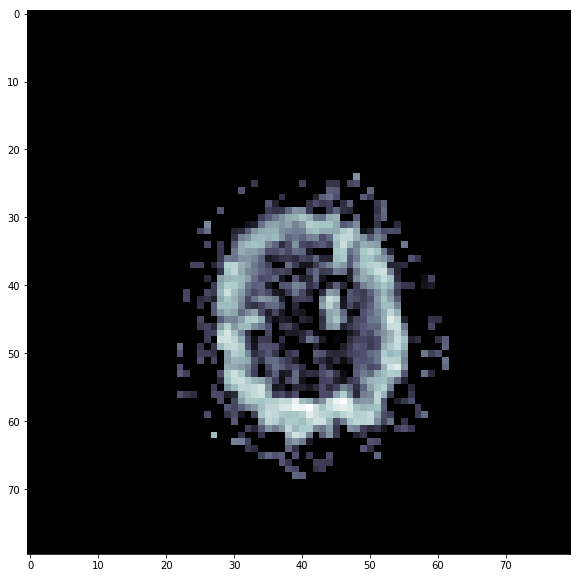

Fractional Ansio.


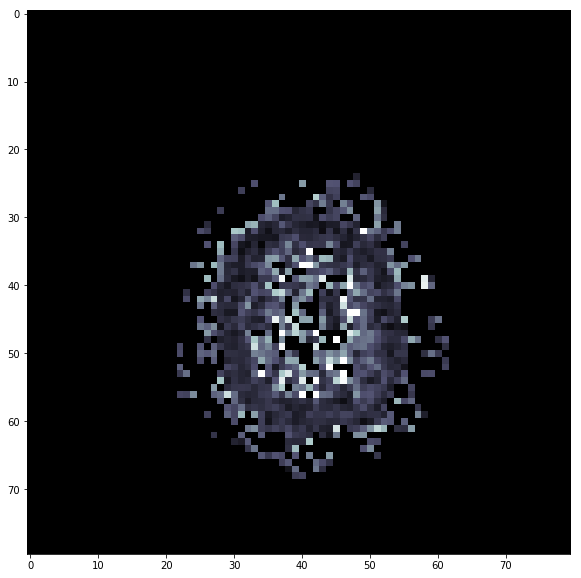

T2-weighted trace


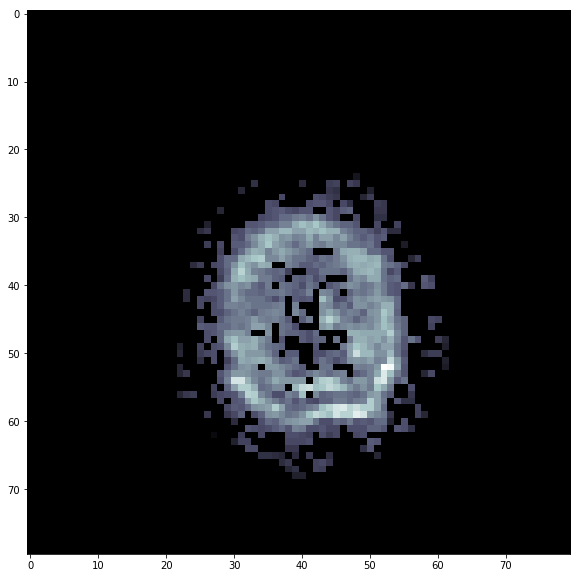

Average DCASSET+AX


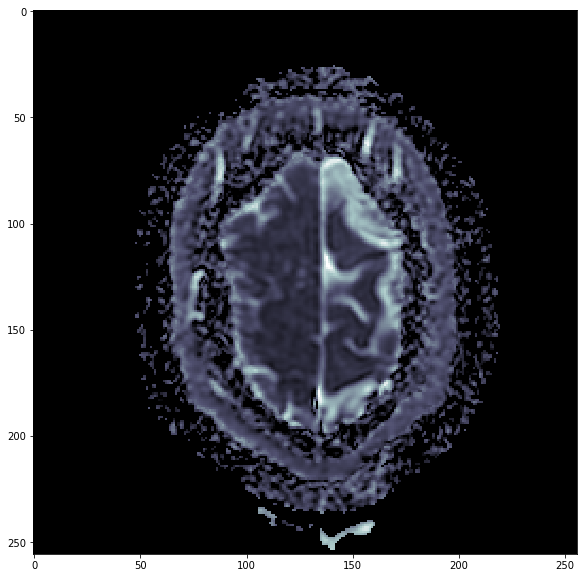

Fractional Ansio.X


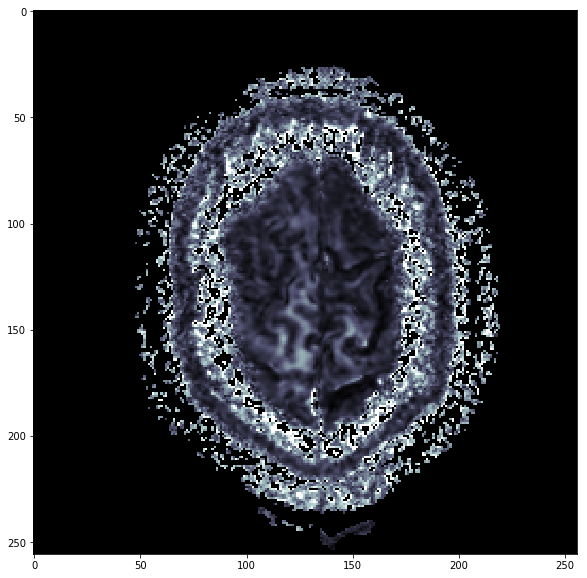

T2-weighted traceX


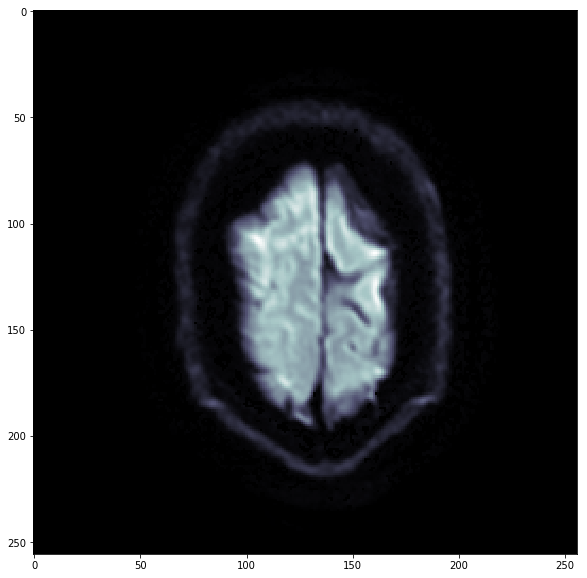

loc


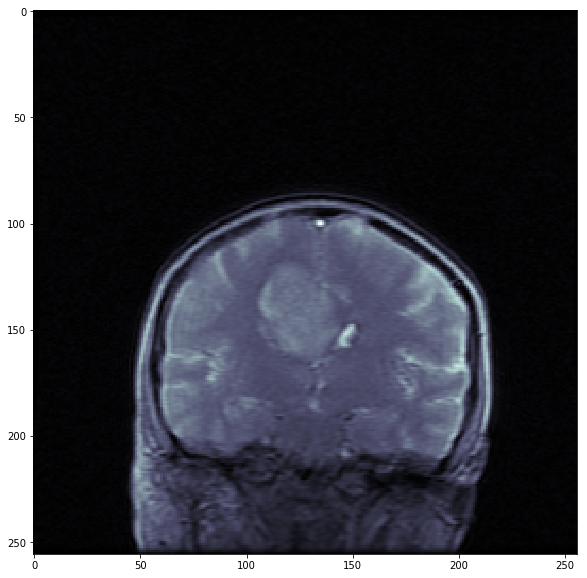

ASSET calibration


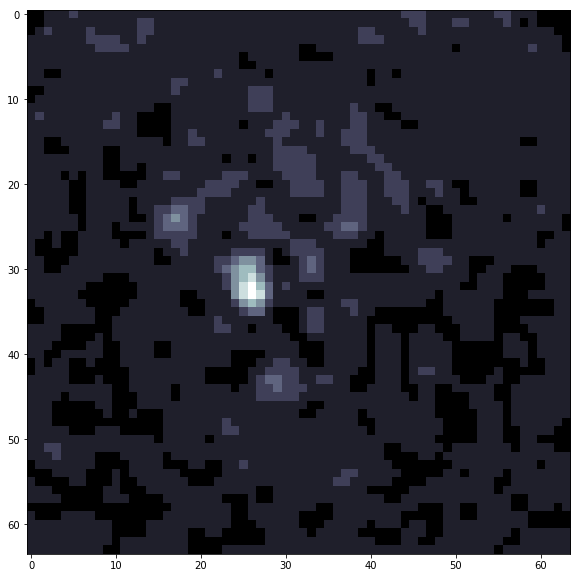

2D MRV


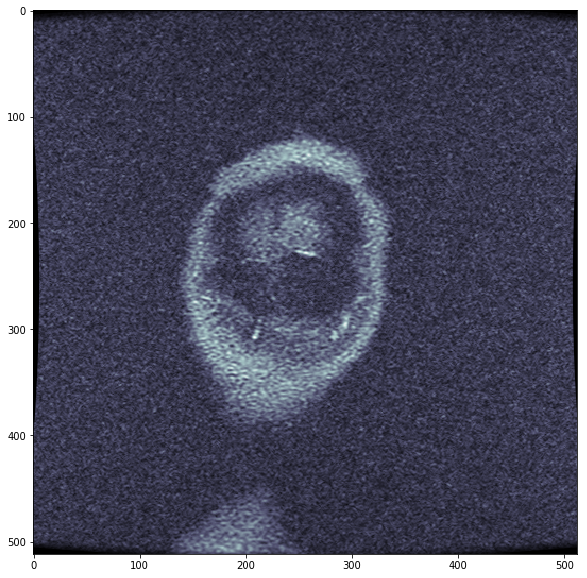

2D MRV+CM


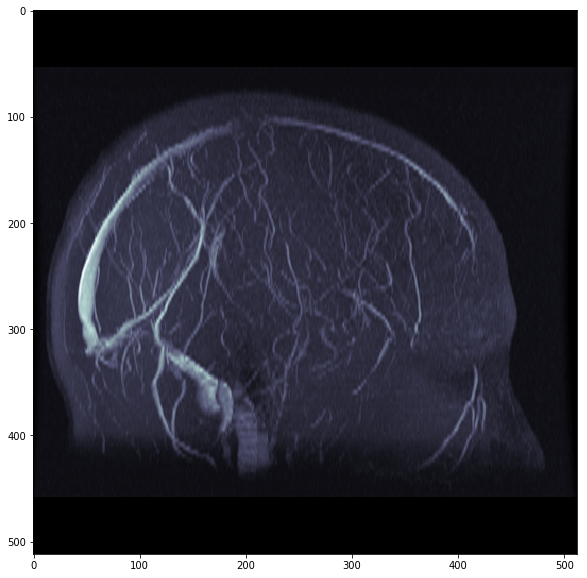

Ax 3D SPGR +Gd


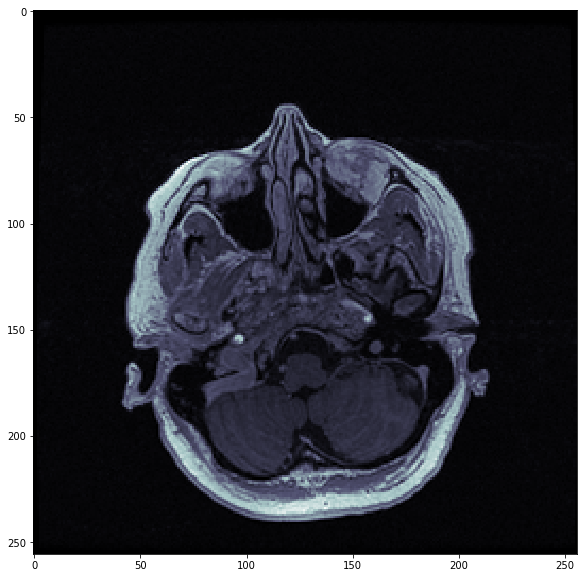

Sag T2 CUBE


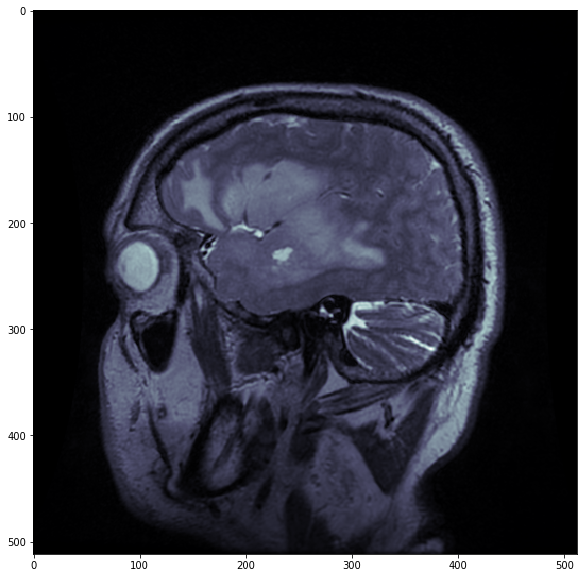

Ax 3D SWAN


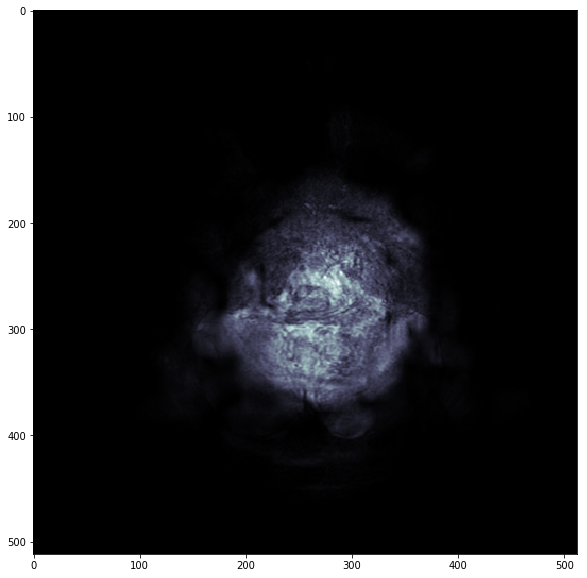

SAG T1 SE +C


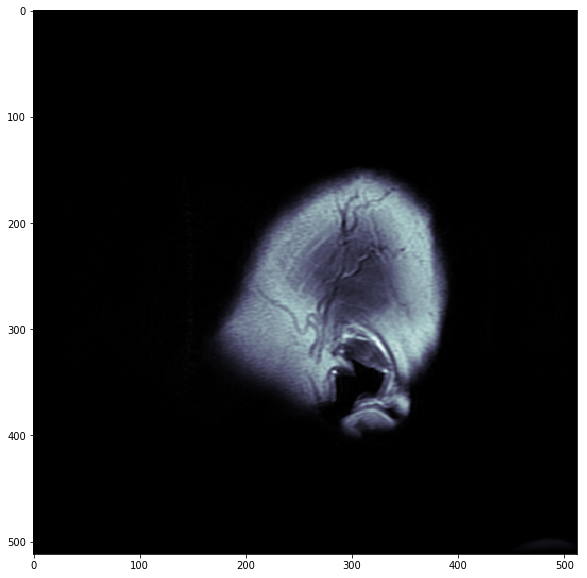

COR T1 SE +C


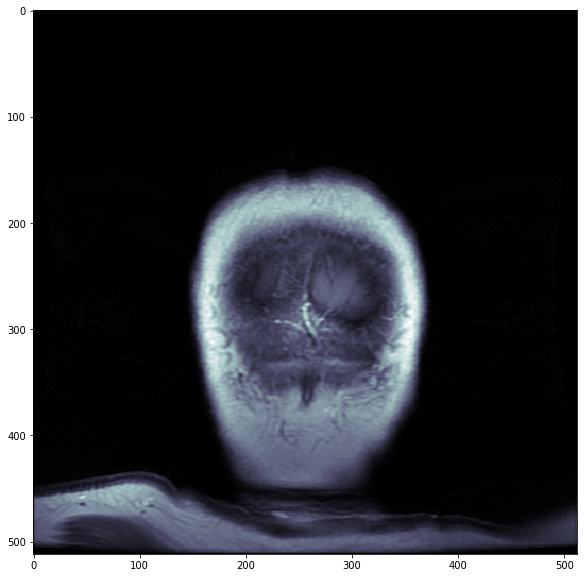

3D ASL (non contrast)


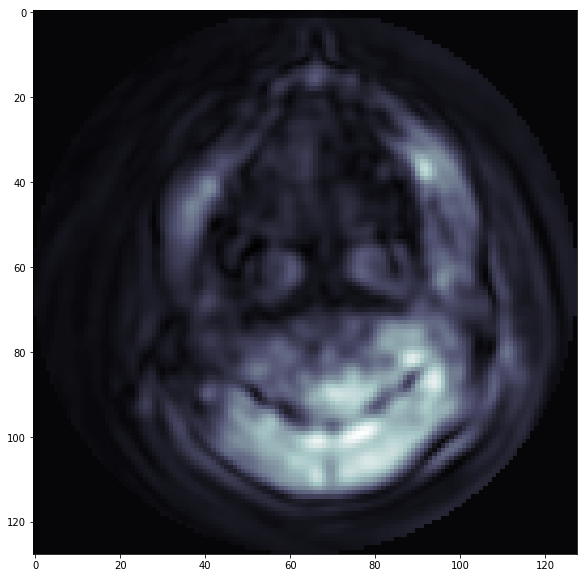

Ax DWI b1000 ALL


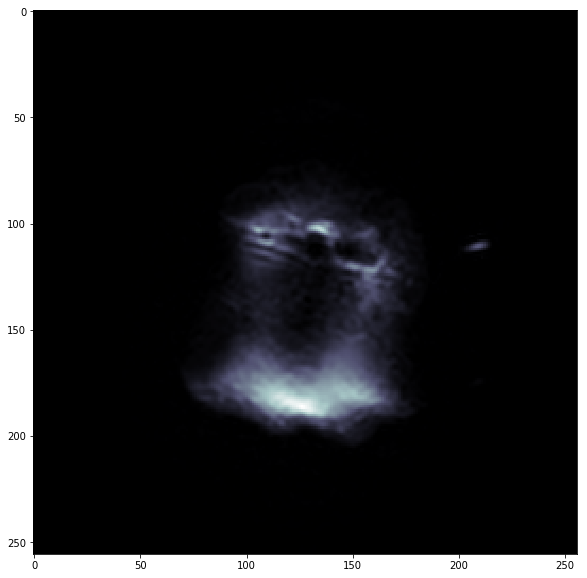

3D ASL (non-contrast)


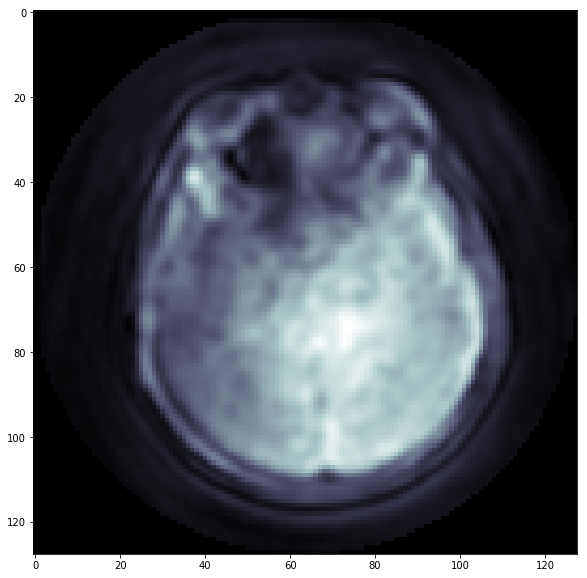

Ax FSPGR BRAVO + C


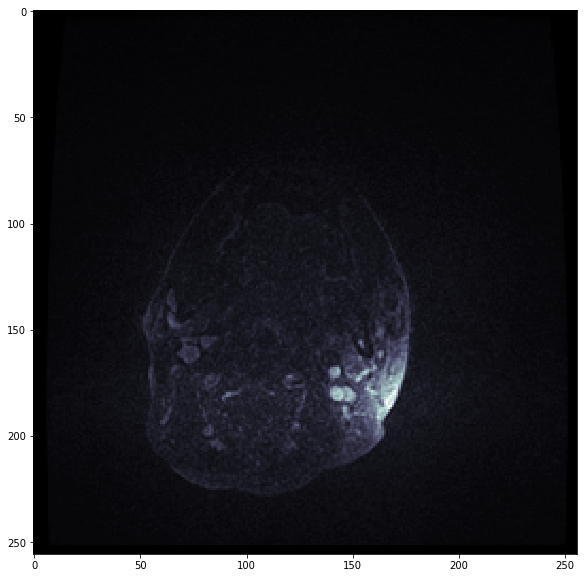

Ax Inh 3D Vel Arterial


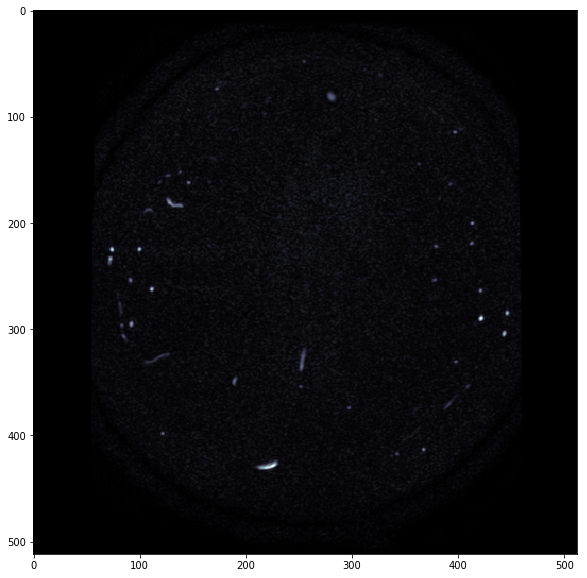

COL:Ax Inh 3D Vel Arterial


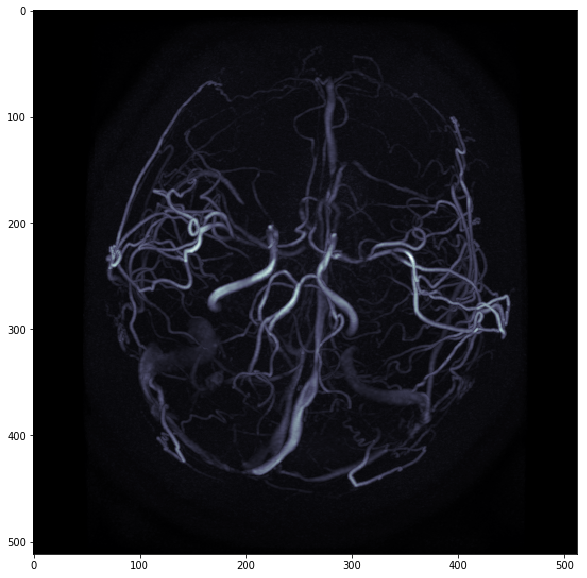

PJN:Ax Inh 3D Vel Arterial


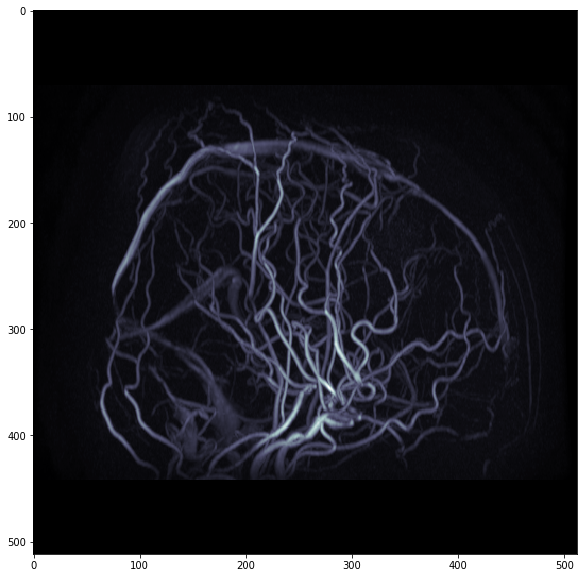

Apparent Diffusion Coefficient (mm2/s)


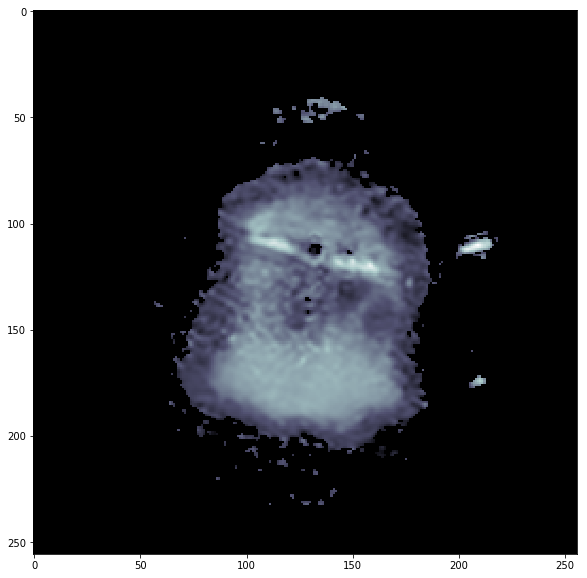

3D Saved State - Processed Images


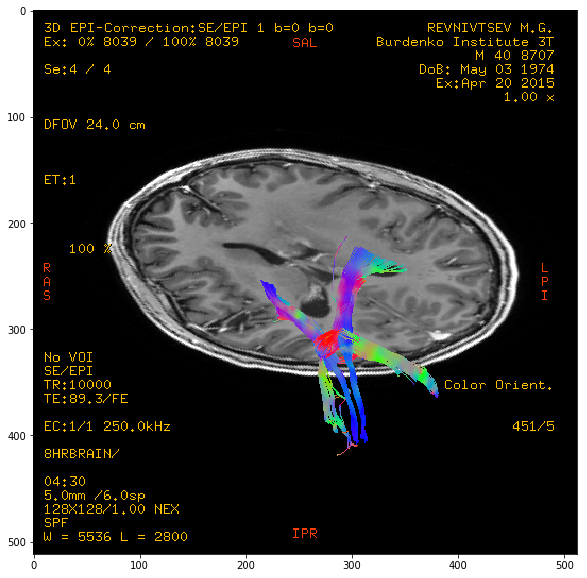

OB


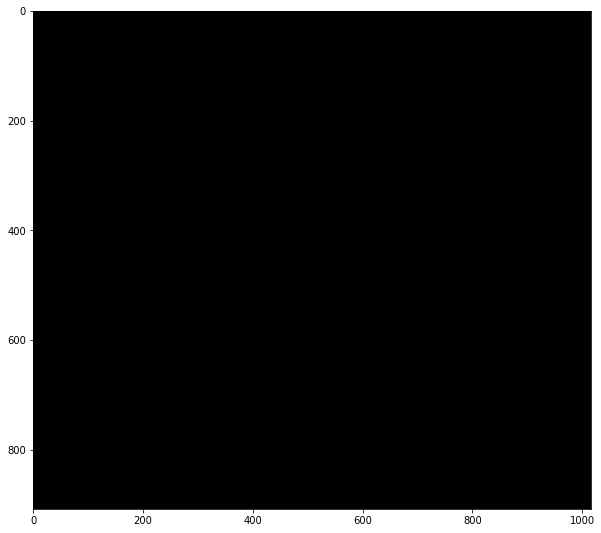

Seg Structural GE Left Hand Motor 3.0T


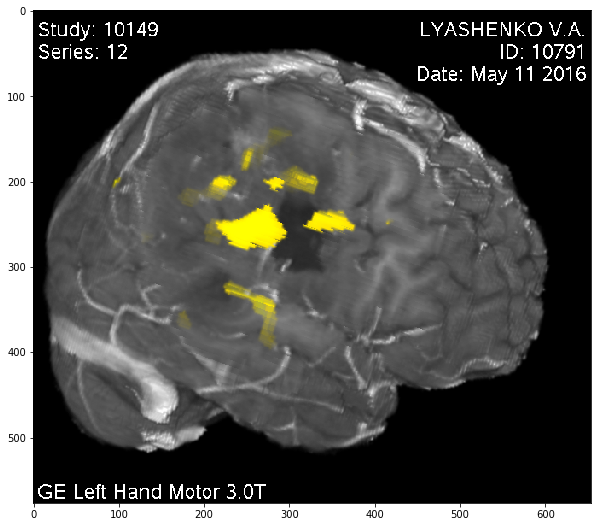

Seg Structural GE Left Leg Motor 3.0T - NEW


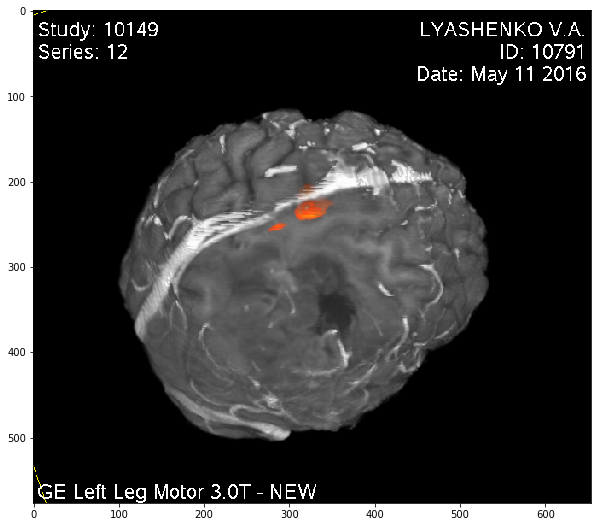

SPECTRO LOC FSE T2


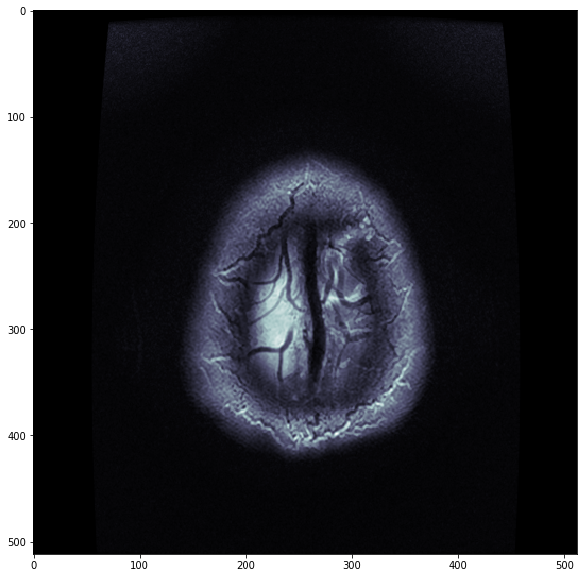

AX


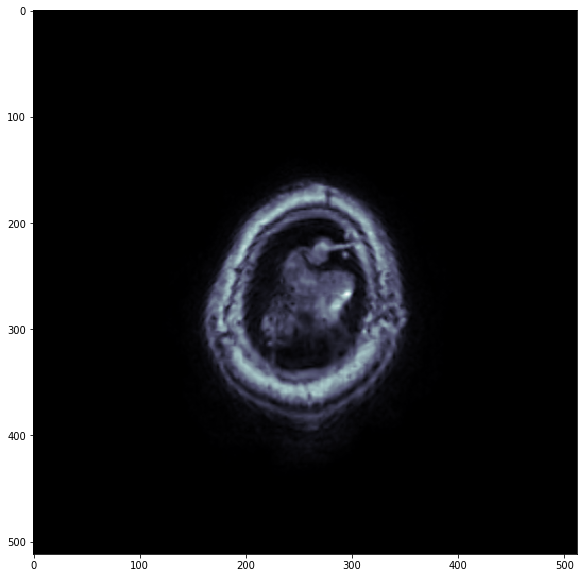

SAG


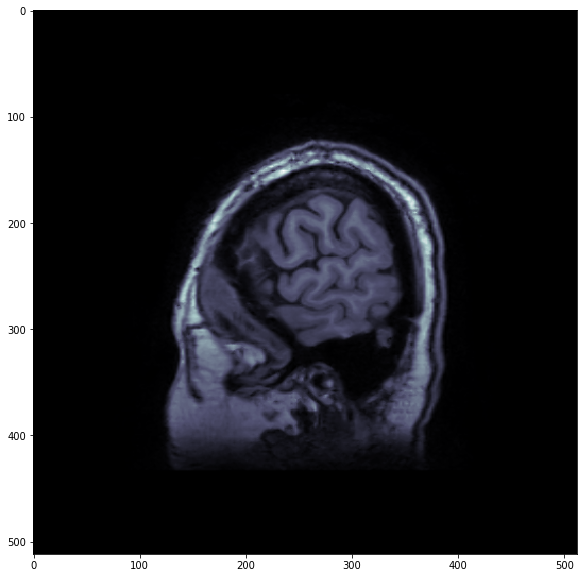

COR


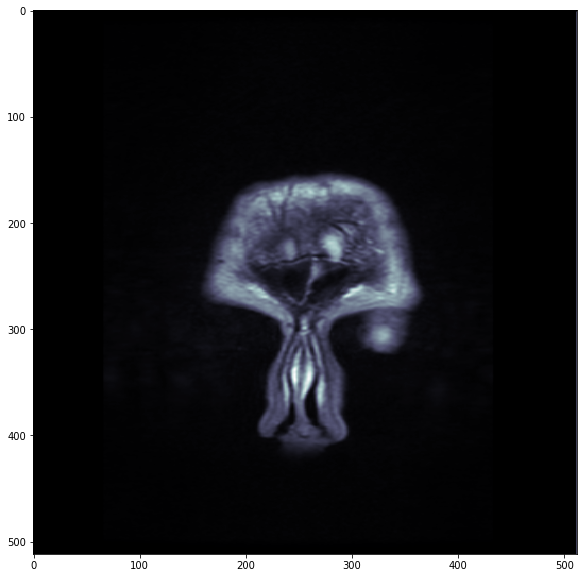

SAG+C


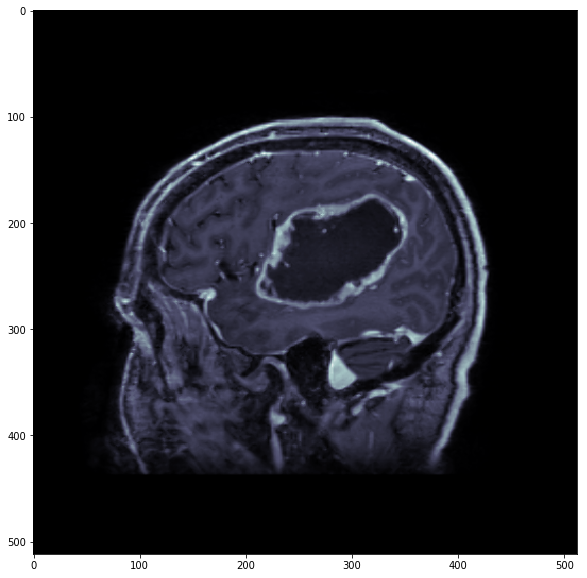

COR + C


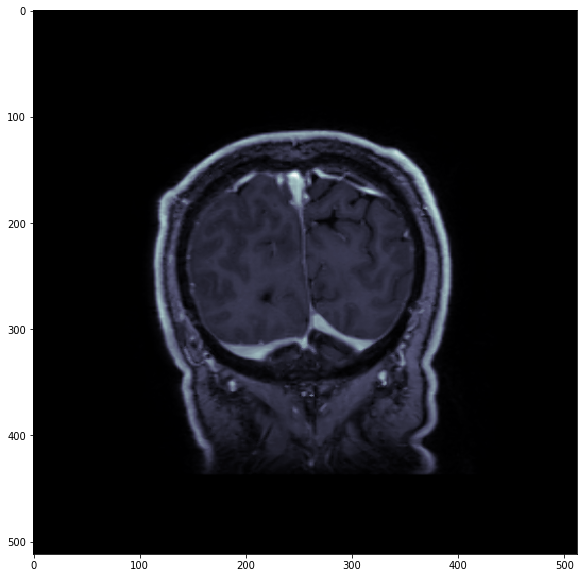

Seg Structural FMRI BROCA - MONTH


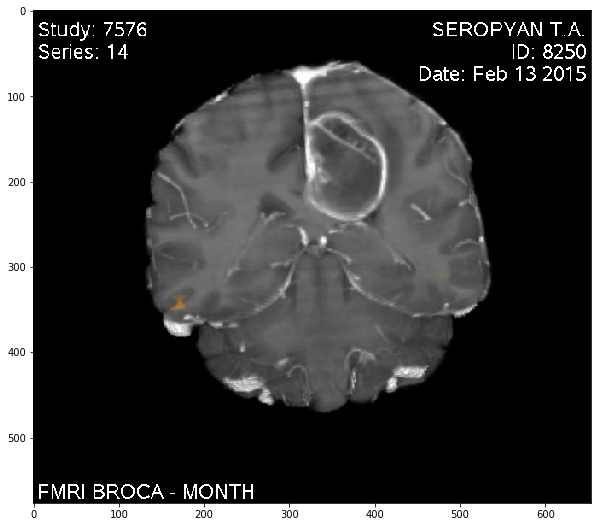

Seg Structural FMRI BROCA - LETTER


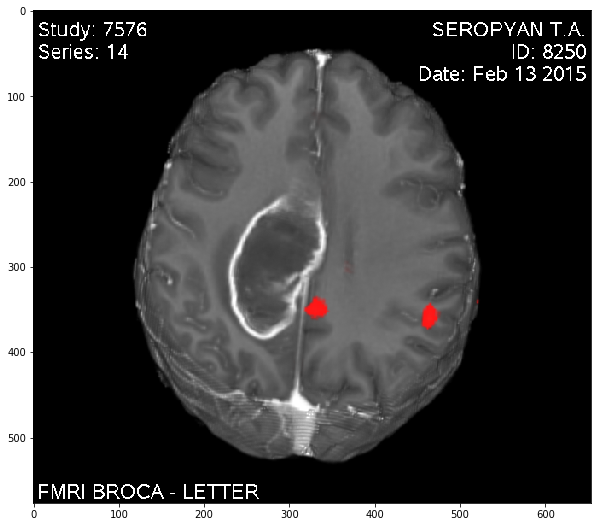

Seg Structural FMRI BROCA - PICTURES


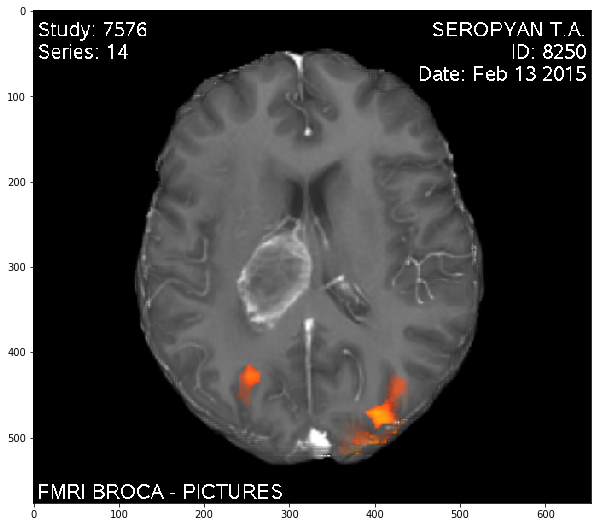

Seg Structural FMRI-BROCA WORDS


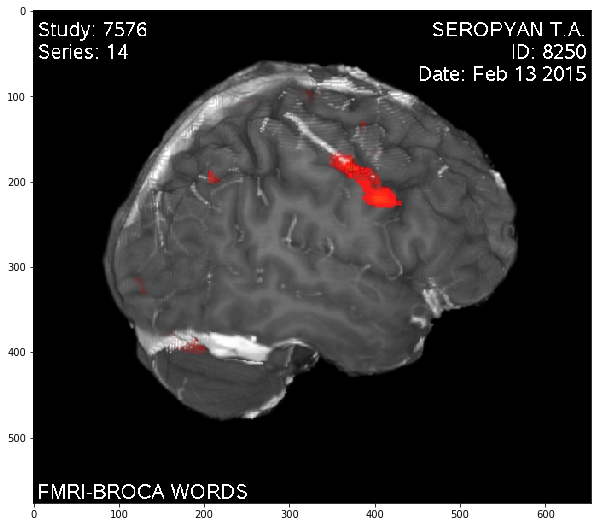

Seg Structural FMRI WERNICKE


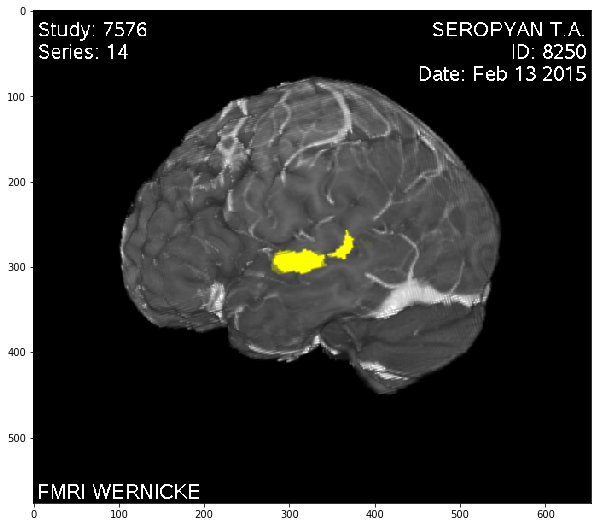

Seg Structural GE Right Hand Motor 3.0T


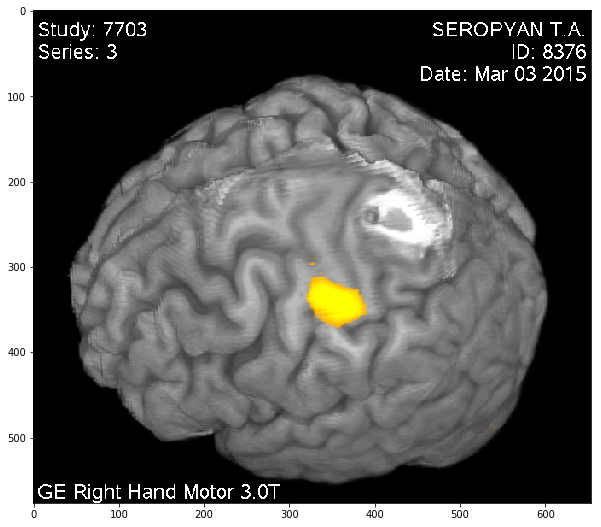

Seg Structural GE Right Leg Motor 3.0T


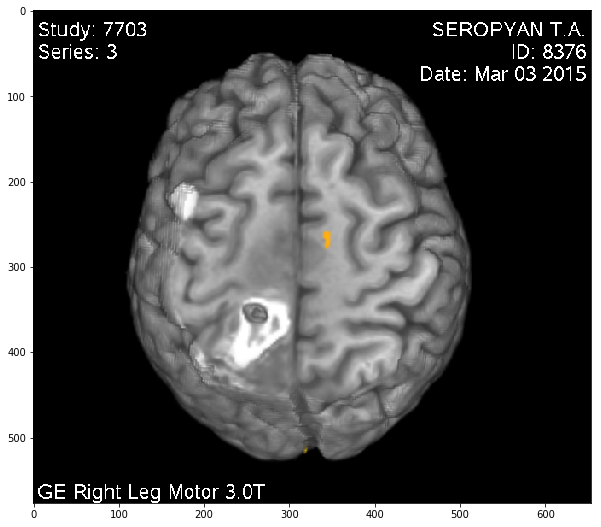

3DTOF MT FS


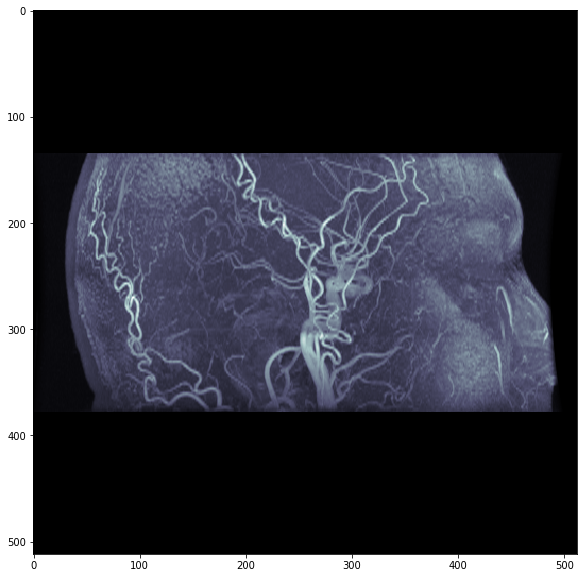

trak


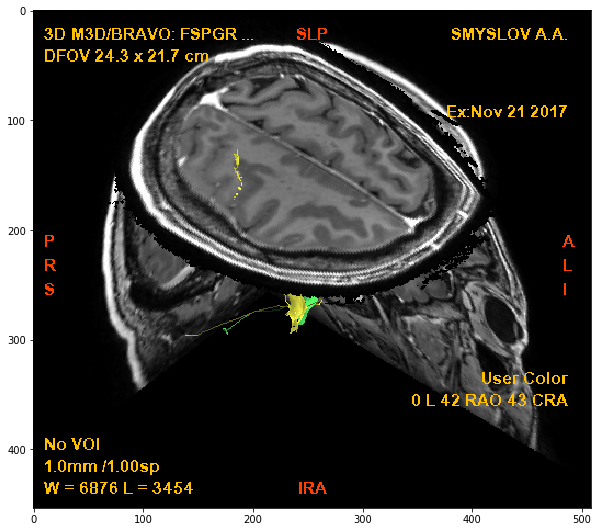

Projection Images


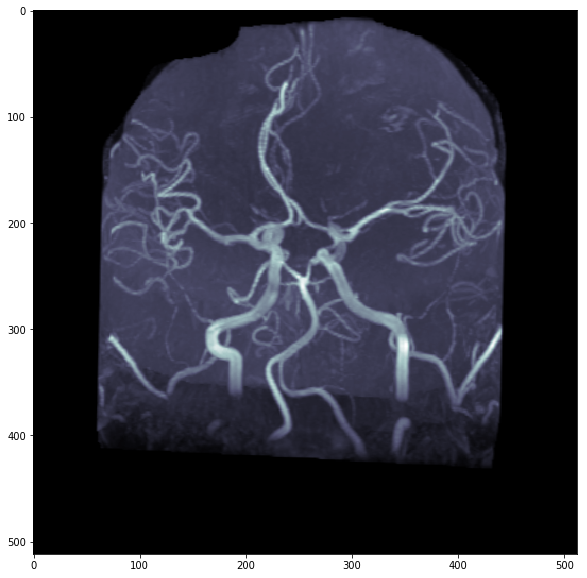

In [40]:
for key, value in imgs.items():
    print(key)
    plot_pixel_array(value.pixel_array)

кол-во снимков не имеющих аттрибута типа вообще(из примерно 20к)

In [18]:
len(d2data)

4096

обычный автокодировщик 4096 -> 500 -> 64 -> 20 -> 64 -> 500 -> 4096

In [8]:
class MyAutoencoder(nn.Module):
    def __init__(self, n_comp=10):
        super(MyAutoencoder, self).__init__()
        s = 100
        self.encoder = nn.Sequential(nn.Linear(4096, 500), nn.Sigmoid(), nn.Linear(500, 64), nn.Sigmoid(), nn.Linear(64, n_comp))
        self.decoder = nn.Sequential(nn.Linear(n_comp, 64), nn.Tanh(), nn.Linear(64, 500), nn.Tanh(), nn.Linear(500, 4096))
        
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
    
def train(network, data, epochs, learning_rate, l2=0):
    loss = nn.MSELoss()
    #SGD
    network.cuda()
    optimizer = torch.optim.Adam(network.parameters(), lr=learning_rate, weight_decay=l2)
    train, test = train_test_split(data)
    train_loader = DataLoader(train, batch_size=50, shuffle=True)
    test_loader = DataLoader(test, batch_size=50, shuffle=True)
    try:
        for epoch in range(epochs):
            train_losses = []
            train_accuracies = []
            
            for X in train_loader:
                X = Variable(X)
                X = X.float()
                X = X.cuda()
                network.zero_grad()
                prediction = network(X)
                loss_batch = loss(prediction, X)
                loss_batch.backward()
                optimizer.step()
                train_losses.append(loss_batch.item())
                
                prediction = prediction.cpu()
                X = X.cpu()
                
                train_accuracies.append(np.absolute((prediction.data.numpy() - X.data.numpy())).sum()) 
            train_losses = np.mean(train_losses)
            train_accuracies = np.mean(train_accuracies)
            
            
            test_losses = []
            test_accuracies = []
            for X in test_loader:
                X = Variable(X)
                X = X.float()
                X = X.cuda()
                prediction = network(X)
                loss_batch = loss(prediction, X)
                test_losses.append(loss_batch.item())
                
                prediction = prediction.cpu()
                X = X.cpu()
                
                test_accuracies.append(np.absolute((prediction.data.numpy() - X.data.numpy())).sum())
            
            test_losses = np.mean(test_losses)
            test_accuracies = np.mean(test_accuracies)
            
            sys.stdout.write('\rEpoch {0}... (Train/Test) MSE: {1:.3f}/{2:.3f}\tAccuracy: {3:.3f}/{4:.3f}'.format(
                        epoch, train_losses, test_losses,
                        train_accuracies, test_accuracies))
        
    except KeyboardInterrupt:
        pass
    network.cpu()
    

In [10]:
autoenc = MyAutoencoder(20)
train(autoenc, d2data, 500, 0.001, 0.1)

Epoch 499... (Train/Test) MSE: 0.054/0.054	Accuracy: 27107.621/26877.016

In [11]:
d = autoenc(d2data)
d

AttributeError: 'numpy.ndarray' object has no attribute 'dim'

в итоге он просто показывает одну и ту же картинку

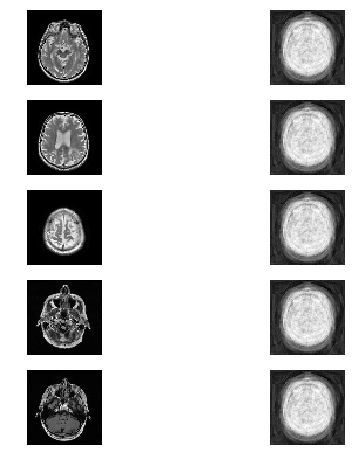

In [21]:
plt.figure(figsize=(8, 8))
for i in range(0, 10 , 2):
    plt.subplot(5, 2, i+1)
    plt.imshow(d2data[i+100].reshape(64, 64), cmap=plt.cm.Greys_r)
    pred = autoenc(Variable(torch.Tensor(d2data[i+100]))).data.numpy()
    plt.axis('off')
    plt.subplot(5, 2, i+2)
    plt.imshow(pred.reshape(64, 64), cmap=plt.cm.Greys_r)
    
    plt.axis('off')
plt.show()

сверточный автокодировщик

In [9]:
class MyCAutoencoder(nn.Module):
    def __init__(self, n_comp=16):
        super(MyCAutoencoder, self).__init__()
        self.ec1 = nn.Conv2d(1,2,(3,3),padding=1) 
        self.ep1 = nn.MaxPool2d(4, return_indices=True) 
        self.ec2 = nn.Conv2d(2,4,(3,3),padding=1)
        self.ep2 = nn.MaxPool2d(2, return_indices=True)
        self.ec3 = nn.Conv2d(4,n_comp,(3,3),padding=1)
        self.ep3 = nn.MaxPool2d(4, return_indices=True)
        self.el = nn.Linear(4,4)
        self.ep4 = nn.MaxPool2d(4, return_indices=True)
        
        self.dp4 = nn.MaxUnpool2d(4)
        self.dl = nn.Linear(4,4)
        self.dp3 = nn.MaxUnpool2d(4)
        self.dc3 = nn.Conv2d(n_comp,4,(3,3),padding=1) 
        self.dp2 = nn.MaxUnpool2d(2)
        self.dc2 = nn.Conv2d(4,2,(3,3),padding=1)
        self.dp1 = nn.MaxUnpool2d(4)
        self.dc1 = nn.Conv2d(2,1,(3,3),padding=1)
        
    def forward(self, x):
        relu = nn.ReLU()
        #encode
        x = self.ec1(x)
        x, i1 = self.ep1(x)
        x = relu(x)
        x = self.ec2(x)
        x, i2 = self.ep2(x)
        x = relu(x)
        x = self.ec3(x)
        x, i3 = self.ep3(x)
        x = relu(x)
        x = self.el(x)
        x, i4 = self.ep4(x)
        
        x = self.dp4(x, i4)
        x = self.dl(x)
        x = relu(x)
        x = self.dp3(x, i3)
        x = self.dc3(x)
        x = relu(x)
        x = self.dp2(x, i2)
        x = self.dc2(x)
        x = relu(x)
        x = self.dp1(x, i1)
        x = self.dc1(x)

        
        return x
    def encode(self, x):
        relu = nn.ReLU()
        
        x = self.ec1(x)
        x, i1 = self.ep1(x)
        x = relu(x)
        x = self.ec2(x)
        x, i2 = self.ep2(x)
        x = relu(x)
        x = self.ec3(x)
        x, i3 = self.ep3(x)
        x = relu(x)
        x = self.el(x)
        x, i4 = self.ep4(x)
        
        return x

In [10]:
d3data, y = extract_data(datafiles)

3d im count 20


In [15]:
cautoenc = MyCAutoencoder(20)
train(cautoenc, d3data, 500, 0.001)

Epoch 60... (Train/Test) MSE: 0.032/0.032	Accuracy: 118541.383/116905.797

показывает что - то странное, причем выдает отрицательные значения, хотя на вход только положительные

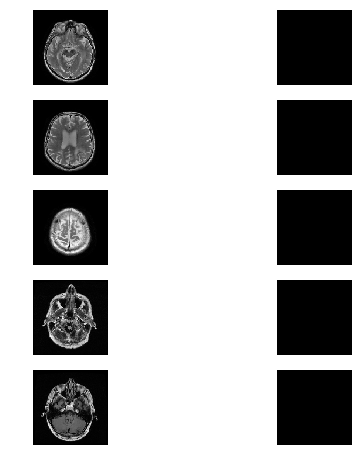

In [16]:
plt.figure(figsize=(8, 8))
for i in range(0, 10 , 2):
    plt.subplot(5, 2, i+1)
    plt.imshow(d3data[i+100].reshape(128, 128), cmap=plt.cm.Greys_r)
    pred = cautoenc(Variable(torch.Tensor([d3data[i+100]]))).data.numpy()
    #pred = np.abs(pred)#attentio
    plt.axis('off')
    plt.subplot(5, 2, i+2)
    plt.imshow(pred.reshape(128, 128), cmap=plt.cm.Greys_r)
    
    plt.axis('off')
plt.show()

In [13]:
imgs['none'][0x8, 0x1030]

(0008, 1030) Study Description                   LO: 'HARDI'

In [9]:
imgs.keys()

dict_keys(['OBZOR +GD/3', 'OBZOR +GD/4', 'OBZOR +GD/5', 'OBZOR +GD/6', 'HARDI+GD NEW/9', 'HARDI+GD NEW/11', 'HARDI+GD NEW/10', '3D BRAIN AZIM/8', 'none', 'Synthetic MR SE', 'Synthetic MR IR', 'Brain 3D', 'HARDI+GD NEW/3', 'HARDI+GD NEW/5', 'HARDI+GD NEW/7', 'HARDI+GD NEW/8', 'HARDI.CHMT/3', 'HARDI.CHMT/5', 'HARDI.CHMT/7', 'RADIOLOGIYA.BRAVO+C/6', 'RADIOLOGIYA.BRAVO+C/8', 'RADIOLOGIYA.BRAVO+C/7', 'BRAIN STD./4', 'BRAIN STD./5', 'BRAIN STD./7', 'BRAIN STD./6', 'BRAIN STD./23', 'HARDI Aram/10', 'DTI BRAIN ASSET/4', 'H1 SPECTRO AZIM/4', 'Brain TUMOR', 'HARDI+GD NEW/1', 'HARDI+GD NEW/4', 'HARDI+GD NEW/6', 'HARDI+GD NEW/12', 'HARDI+GD/3', 'HARDI+GD/5', 'HARDI+GD/7', 'HARDI+GD/8', 'HARDI+GD/9', 'HARDI+GD/10', 'HARDI+GD/11', 'HEAD FAST/1', 'HEAD FAST/2', 'ANGIO/6', 'GAMMA KNIFE/3', 'OBZOR/1', 'OBZOR/2', 'OBZOR/3', 'OBZOR/4', 'OBZOR/5', '3D BRAIN AZIM/7', '3D BRAIN AZIM/3', 'BRAIN STD./21', 'BRAIN STD./11', 'BRAIN STD./12', 'MENINGIOMA 2 RESEARCH/7', 'Brain SPGAR', 'Brain TUMOR 2', 'ADC', 'HARD

In [22]:
imgs.keys()

dict_keys(['HEAD+DTI', 'HEAD', 'HEAD+HARDI', 'FMRI+HARDI', 'HEAD+SPECTR', 'F MRT GRANT', 'HEAD.DTI', 'HARDI'])

In [16]:
imgs['HARDI.CHMT/3'][attrs[6]]

(0018, 1030) Protocol Name                       LO: 'HARDI.CHMT/3'

In [25]:
imgs['HARDI']

(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY', 'SCREEN SAVE', 'VOLREN']
(0008, 0012) Instance Creation Date              DA: '20160411'
(0008, 0013) Instance Creation Time              TM: '150213'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.840.113619.2.80.984800186.20509.1460372533.14
(0008, 0020) Study Date                          DA: '20160411'
(0008, 0021) Series Date                         DA: '20160411'
(0008, 0022) Acquisition Date                    DA: '20160411'
(0008, 0023) Content Date                        DA: ''
(0008, 0030) Study Time                          TM: '134214'
(0008, 0031) Series Time                         TM: '150009'
(0008, 0032) Acquisition Time                    TM: '143609'
(0008, 0033) Content Time                        TM: ''
(0008, 0050) Accession Numb

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from xgboost import XGBClassifier

def check_models(X, y, metric='accuracy'):
    res = {'LogisticRegression': 0,
           'DecisionTree': 0,
           'GaussianNB': 0,
           'SVC': 0,
           'SGD': 0,
           'GaussianProcess': 0,
           'XGBoost': 0
          }
    #print metric
    X, y = shuffle(X, y)
    lg = LogisticRegression(solver='liblinear', multi_class='auto')
    cv = cross_validate(lg, X, y, cv=10, scoring=metric)
    res['LogisticRegression'] = np.mean(cv['test_score'])
    
    dt = DecisionTreeClassifier(criterion='gini')
    cv = cross_validate(dt, X, y, cv=10)
    res['DecisionTree'] = np.mean(cv['test_score'])
    
    bayes = GaussianNB()
    cv = cross_validate(bayes, X, y, cv=10, scoring=metric)
    res['GaussianNB'] = np.mean(cv['test_score'])
    
    svc = SVC(kernel='rbf', shrinking=True, probability=False, degree=3, gamma='auto')
    cv = cross_validate(svc, X, y, cv=10, scoring=metric)
    res['SVC'] = np.mean(cv['test_score'])
    
    sgd = SGDClassifier(tol=1e-3, max_iter=1000, loss='hinge')
    cv = cross_validate(sgd, X, y, cv=10, scoring=metric)
    res['SGD'] = np.mean(cv['test_score'])
    
    gp = GaussianProcessClassifier()
    cv = cross_validate(gp, X, y, cv=10, scoring=metric)
    res['GaussianProcess'] = np.mean(cv['test_score'])
    
    gb = XGBClassifier(max_depth=10, n_estimators=20, booster='dart')
    cv = cross_validate(gb, X, y, cv=10, scoring=metric)
    res['XGBoost'] = np.mean(cv['test_score'])
    
    return res

In [33]:
X = autoenc.encoder(Variable(torch.Tensor(d2data))).data.numpy()
check_models(X, y, metric='f1')

{'LogisticRegression': 0.9344179207983727,
 'DecisionTree': 0.8811740167704267,
 'GaussianNB': 0.7807117320508048,
 'SVC': 0.9356416602524019,
 'SGD': 0.9356416602524019,
 'GaussianProcess': 0.9394701335778468,
 'XGBoost': 0.9524904697758446}

In [47]:
import pickle

with open('../models/cautoenc.pkl', 'wb') as file:  
    pickle.dump(cautoenc, file)


In [49]:
X = cautoenc.encode(Variable(torch.Tensor(d3data))).data.numpy()

NameError: name 'cautoenc' is not defined

In [13]:
X = autoenc(Variable(torch.Tensor(d2data))).data.numpy()

In [40]:
X1 = pd.DataFrame(X)

pd.concat([X1, pd.DataFrame(other)], axis=1)

,0,1,2,3,4,5,6,7,8,9,...,4089,4090,4091,4092,4093,4094,4095,0,1,2
0,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
1,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
2,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
3,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
4,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
5,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
6,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
7,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
8,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0
9,-0.000017,-0.00002,-0.000009,2.165448e-08,-0.000016,-0.000006,-0.000008,0.000005,0.000001,-0.000016,...,-0.000059,-0.000089,-0.000083,-0.000134,-0.000031,-0.000014,0.000006,1.0,56.0,100.0


In [24]:
X2

,0,1,2
0,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
1,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
2,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
3,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
4,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
5,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
6,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
7,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
8,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."
9,"(0010, 0040) Patient's Sex ...","(0010, 1010) Patient's Age ...","(0010, 1030) Patient's Weight ..."


In [55]:
#X.reshape((9038,20))
check_models(X.reshape((9038, 20)), y, metric='f1')

{'LogisticRegression': 0.9356416602524019,
 'DecisionTree': 0.8624706166675844,
 'GaussianNB': 0.6646790364303035,
 'SVC': 0.939214715148732,
 'SGD': 0.8922594140029545,
 'GaussianProcess': 0.9275337500491917,
 'XGBoost': 0.9418627117105404}

In [ ]:
#название темы
#обзор: состояние по сеткам(сами автокодировщики), состояние в снимках, возможно про саму флуоресц
#обосновать актуальность задачи, обзор литературы
#1)постановка 2)прошлый результат 3)новый результат - семинар

Применение автокодирующих нейронных сетей для предсказания флуоресценции глиом головного мозга по данным
магнитно-резонансной томографии.
Autoencoder neural networks for brain glioma fluorescence prediction in magnetic resonance imaging.

In [7]:
class MySparceAutoencoder(nn.Module):
    def __init__(self, n_comp=10, size=16384):
        super(MySparceAutoencoder, self).__init__()
        self.n_comp = n_comp
        self.el1 = nn.Linear(size, 5000)
        self.el2 = nn.Linear(5000, 500)
        self.el3 = nn.Linear(500, 100)
        
        self.dl3 = nn.Linear(100, 500)
        self.dl2 = nn.Linear(500, 5000)
        self.dl1 = nn.Linear(5000, size)
    def forward(self, x):
        sigm = nn.Sigmoid()
        tan = nn.Tanh()
        
        x = self.el1(x)
        x = sigm(x)
        x = self.el2(x)
        x = sigm(x)
        x = self.el3(x)
        
        x[x < x.sort(descending=True)[0][self.n_comp - 1]] = 0
        
        x = self.dl3(x)
        x = tan(x)
        x = self.dl2(x)
        x = tan(x)
        x = self.dl1(x)
        
        return x
    

In [45]:
class MySparceAutoencoder(nn.Module):
    def __init__(self, n_comp=10, size=4096):
        super(MySparceAutoencoder, self).__init__()
        self.n_comp = n_comp
        self.el1 = nn.Linear(size, 1000)
        self.el2 = nn.Linear(1000, 500)
        self.el3 = nn.Linear(500, 100)
        
        self.dl3 = nn.Linear(100, 500)
        self.dl2 = nn.Linear(500, 1000)
        self.dl1 = nn.Linear(1000, size)
    def forward(self, x):
        sigm = nn.Sigmoid()
        tan = nn.Tanh()
        
        x = self.el1(x)
        x = sigm(x)
        x = self.el2(x)
        x = sigm(x)
        x = self.el3(x)
        
        #sorted = x.sort(dim=1, descending=True)
        #for i, j in zip(x, x.sort(dim=1, descending=True)[0]):
        #    i[i < j[1]] = 0
        
        x[x < x.sort(dim=1, descending=True)[0][:,self.n_comp - 1].resize(len(x),1)] = 0
        #x[x < x.sort(dim=1, descending=True)[0][self.n_comp - 1]] = 0
        
        x = self.dl3(x)
        x = tan(x)
        x = self.dl2(x)
        x = tan(x)
        x = self.dl1(x)
        
        return x
    

In [16]:
dsparcedata, y = extract_data(datafiles, sh=64, d3=False)

3d im count 20


In [47]:
sautoenc = MySparceAutoencoder(20)
train(sautoenc, dsparcedata, 1000, 0.001)

Epoch 999... (Train/Test) MSE: 0.009/0.009	Accuracy: 10876.606/10900.841

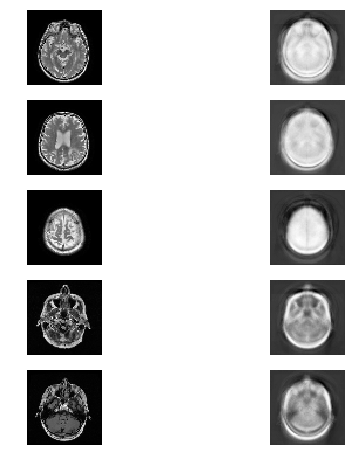

In [48]:
plt.figure(figsize=(8, 8))
for i in range(0, 10 , 2):
    plt.subplot(5, 2, i+1)
    plt.imshow(dsparcedata[i+100].reshape(64, 64), cmap=plt.cm.Greys_r)
    pred = sautoenc(Variable(torch.Tensor([dsparcedata[i+100]]))).data.numpy()
    #pred = np.abs(pred)#attentio
    plt.axis('off')
    plt.subplot(5, 2, i+2)
    plt.imshow(pred.reshape(64, 64), cmap=plt.cm.Greys_r)
    
    plt.axis('off')
plt.show()

In [30]:
tt = torch.tensor([[1,2,3,4],[5,6,7,8],[9,10,11,12]])
tt

tensor([[ 1,  2,  3,  4],
        [ 5,  6,  7,  8],
        [ 9, 10, 11, 12]])

In [33]:
tt[tt < tt.sort(dim=1, descending=True)[0][:,1]] = 0
tt

RuntimeError: The size of tensor a (4) must match the size of tensor b (3) at non-singleton dimension 1

In [44]:
tt[tt < tt.sort(dim=1, descending=True)[0][:,1].resize(len(tt),1)] = 0
tt

tensor([[ 0,  0,  3,  4],
        [ 0,  0,  7,  8],
        [ 0,  0, 11, 12]])

In [7]:
class MyDeepAutoencoder64(nn.Module):
    def __init__(self, n_comp=10):
        super(MyDeepAutoencoder64, self).__init__()
        self.n_comp = n_comp
        
        self.encoder = nn.ModuleList([nn.Linear(4096, 2000), 
        nn.Linear(2000, 1100), 
        nn.Linear(1100, 500),  
        nn.Linear(500, 300),  
        nn.Linear(300, 100), 
        nn.Linear(100, n_comp)])
        self.decoder = nn.ModuleList([nn.Linear(n_comp, 100), 
        nn.Linear(100, 300), 
        nn.Linear(300, 500), 
        nn.Linear(500, 1100),
        nn.Linear(1100, 2000), 
        nn.Linear(2000, 4096)])
        
        self.depth = 6

    def forward(self, x, s=6):
        sigm = nn.Sigmoid()
        for i in range(s):
            x = self.encoder[i](x)
            if i != s - 1:
                x = sigm(x)
        
        tan = nn.Tanh()
        for i in range(self.depth - s, self.depth):
            if i != self.depth - s:
                x = tan(x)
            x = self.decoder[i](x)
        
        return x

    def encode(self, x, s=6):
        sigm = nn.Sigmoid()
        for i in range(s):
            x = self.encoder[i](x)
            if i != s - self.depth:
                x = sigm(x)
        
        return x.data.numpy()
                                

In [8]:
def train(network, data, epochs, learning_rate, l2=0, opt='SGD'):
    loss = nn.MSELoss()
    #SGD Adam
    network.cuda()
    if opt == 'SGD':
        optimizer = torch.optim.SGD(network.parameters(), lr=learning_rate, weight_decay=l2)
    elif opt == 'Adam':
        optimizer = torch.optim.Adam(network.parameters(), lr=learning_rate, weight_decay=l2)
    train, test = train_test_split(data)
    train_loader = DataLoader(train, batch_size=50, shuffle=True)
    test_loader = DataLoader(test, batch_size=50, shuffle=True)
    try:
        for epoch in range(epochs):
            train_losses = []
            train_accuracies = []
            
            for X in train_loader:
                X = Variable(X)
                X = X.float()
                X = X.cuda()
                network.zero_grad()
                prediction = network(X)
                loss_batch = loss(prediction, X)
                loss_batch.backward()
                optimizer.step()
                train_losses.append(loss_batch.item())
                
                prediction = prediction.cpu()
                X = X.cpu()
                
                train_accuracies.append(np.absolute((prediction.data.numpy() - X.data.numpy())).sum()) 
            train_losses = np.mean(train_losses)
            train_accuracies = np.mean(train_accuracies)
            
            
            test_losses = []
            test_accuracies = []
            for X in test_loader:
                X = Variable(X)
                X = X.float()
                X = X.cuda()
                prediction = network(X)
                loss_batch = loss(prediction, X)
                test_losses.append(loss_batch.item())
                
                prediction = prediction.cpu()
                X = X.cpu()
                
                test_accuracies.append(np.absolute((prediction.data.numpy() - X.data.numpy())).sum())
            
            test_losses = np.mean(test_losses)
            test_accuracies = np.mean(test_accuracies)
            
            sys.stdout.write('\rEpoch {0}... (Train/Test) MSE: {1:.3f}/{2:.3f}\tAccuracy: {3:.3f}/{4:.3f}'.format(
                        epoch, train_losses, test_losses,
                        train_accuracies, test_accuracies))
        
    except KeyboardInterrupt:
        pass
    network.cpu()

In [16]:
def pretrain(network, data, epochs, learning_rate):
    sigm = nn.Sigmoid()
    sigm.eval()
    for d in range(network.depth):
        if d != 0:
            curr_data = curr_data.data.numpy()
            train(nn.Sequential(nn.Sigmoid(), network.encoder[d], network.decoder[network.depth - d - 1], nn.Tanh()),
                 curr_data, epochs, learning_rate, opt='Adam')
            
            network.encoder[d].eval()
            network.decoder[network.depth - d - 1].eval()

            curr_data = sigm(torch.Tensor(curr_data))
            curr_data = network.encoder[d](curr_data)
        else:
            train(nn.Sequential(network.encoder[d], network.decoder[network.depth - d - 1]),
                 data, epochs, learning_rate, opt='Adam')
            
            network.encoder[d].eval()
            network.decoder[network.depth - d - 1].eval()
            curr_data = network.encoder[d](torch.Tensor(data))
    
    for e in network.encoder:
        e.train()
        
    for e in network.decoder:
        e.train()
        

In [19]:
def pretrain(network, data, epochs, learning_rate, l2=0, opt='SGD'):
    loss = nn.MSELoss()
    #SGD Adam
    network.cuda()
    sigm = nn.Sigmoid()
    sigm.eval()
    if opt == 'SGD':
        optimizer = torch.optim.SGD(network.parameters(), lr=learning_rate, weight_decay=l2)
    elif opt == 'Adam':
        optimizer = torch.optim.Adam(network.parameters(), lr=learning_rate, weight_decay=l2)
    train, test = train_test_split(data)
    train_loader = DataLoader(train, batch_size=50, shuffle=True)
    test_loader = DataLoader(test, batch_size=50, shuffle=True)
    try:
        for epoch in range(epochs):
            for e in network.encoder:
                e.train()
        
            for e in network.decoder:
                e.train()
            
            for d in range(network.depth):
                if d != 0:
                    network.encoder[d - 1].eval()
                    network.decoder[network.depth - d].eval()
                
                train_losses = []
                train_accuracies = [] 
                for X in train_loader:
                    X = Variable(X)
                    X = X.float()
                    X = X.cuda()
                    network.zero_grad()
                    
                    prediction = network(X, d + 1)
                    
                    loss_batch = loss(prediction, X)
                    loss_batch.backward()
                    optimizer.step()
                    train_losses.append(loss_batch.item())
                    
                    prediction = prediction.cpu()
                    X = X.cpu()
                    
                    train_accuracies.append(np.absolute((prediction.data.numpy() - X.data.numpy())).sum()) 
                
                train_losses = np.mean(train_losses)
                train_accuracies = np.mean(train_accuracies)
                
                
                test_losses = []
                test_accuracies = []
                for X in test_loader:
                    X = Variable(X)
                    X = X.float()
                    X = X.cuda()
                    prediction = network(X, d + 1)
                    loss_batch = loss(prediction, X)
                    test_losses.append(loss_batch.item())
                    
                    prediction = prediction.cpu()
                    X = X.cpu()
                    
                    test_accuracies.append(np.absolute((prediction.data.numpy() - X.data.numpy())).sum())
                
                test_losses = np.mean(test_losses)
                test_accuracies = np.mean(test_accuracies)
                
                sys.stdout.write('\rEpoch {0}... (Train/Test) MSE: {1:.3f}/{2:.3f}\tAccuracy: {3:.3f}/{4:.3f}'.format(
                        epoch, train_losses, test_losses,
                        train_accuracies, test_accuracies))
    
    except KeyboardInterrupt:
        pass
    network.cpu()
    for e in network.encoder:
        e.train()
        
    for e in network.decoder:
        e.train()

In [20]:
sautoenc = MyDeepAutoencoder64(20)
pretrain(sautoenc, d2data, 100, 0.1)
#train(sautoenc, d2data, 1000, 0.001, opt='Adam')

Epoch 21... (Train/Test) MSE: 0.017/0.017	Accuracy: 17079.340/16695.764

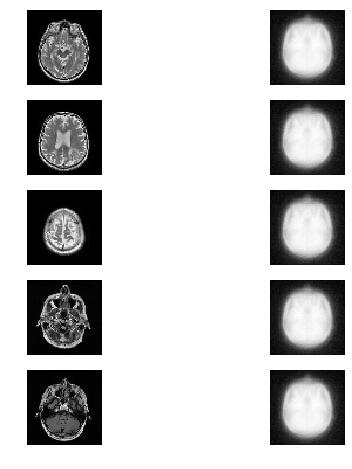

In [21]:
plt.figure(figsize=(8, 8))
for i in range(0, 10 , 2):
    plt.subplot(5, 2, i+1)
    plt.imshow(d2data[i+100].reshape(64, 64), cmap=plt.cm.Greys_r)
    pred = sautoenc(Variable(torch.Tensor(d2data[i+100]))).data.numpy()
    plt.axis('off')
    plt.subplot(5, 2, i+2)
    plt.imshow(pred.reshape(64, 64), cmap=plt.cm.Greys_r)
    
    plt.axis('off')
plt.show()

In [14]:
def extract_data(datafiles, sh=128, d3=True):
    data = []
    y = []
    other = []
    flourescented = ['DEMKIN A.P.', 'ZHURAVLEVA E.V.', 'MOVLATOVA L.B.', 'PETROV S.V.', 'POPOVA I.I.', 'SAFRONOVA T.A.', 'ANTROPOVA E.P.', 
 'BRITIKOVA E.V.', 'GACHKAEVA S.V.', 'SHURUPOV V.YA.', 'KHAKIMOVA M.M.', 'DASHKINA R.F.']
    count = 0
    for fileDCM in datafiles:
        ds = pydicom.read_file(fileDCM)

        sex = ds[(0x10, 0x40)].value
        sex = 1 if sex == 'M' else 0
        age = ds[(0x10, 0x1010)].value
        age = int(age[:-1])
        weight = ds[(0x10, 0x1030)].value
        weight = float(weight)

        patient = ds[attrs[13]].value
        ds = ds.pixel_array
        if len(ds.shape) > 2:
            count += 1
            continue

        other.append([sex, age, weight])
        
        if ds.shape[0] != sh:
                
            gg = Image.fromarray(ds)
            gg = gg.resize((sh, sh))
            curr = np.asarray(gg)
            if not d3:
                curr = curr.reshape(sh**2)
        else:
            curr = ds
            if not d3:
                curr = curr.reshape(sh**2)
        mmax = float(np.max(curr))
        if mmax != 0:
            curr = curr / mmax 
        if d3:
            data.append([curr])
        else:
            data.append(curr)
        if patient in flourescented:
            y.append(0)
        else:
            y.append(1)
    print('3d im count', count)
    data = np.array(data, dtype=float)
    other = np.array(other)
    return data, y, other 

In [10]:
#d2data64, y, other = extract_data(datafiles, sh=64, d3=False)
#d2data128, y, other = extract_data(datafiles, sh=128, d3=False)
d3data128, y, other = extract_data(datafiles, sh=128, d3=True)

3d im count 20


In [10]:
import pickle
with open('../data/d2data64.pickle', 'wb') as f:
    pickle.dump(d2data64, f)


In [11]:
import pickle
with open('../data/d3data128.pickle', 'wb') as f:
    pickle.dump(d3data128, f)

In [11]:
with open('../data/d2data128.pickle', 'wb') as f:
    pickle.dump(d2data128, f)
with open('../data/d3data128.pickle', 'wb') as f:
    pickle.dump(d3data128, f)
with open('../data/y.pickle', 'wb') as f:
    pickle.dump(y, f)

other = pd.DataFrame(other)



ValueError: Must pass 2-d input

In [19]:
with open('../data/other.pickle', 'wb') as f:
    pickle.dump(other, f)

In [4]:
import torch
print(torch.cuda.device_count())

1
